# Links de que me ayudaron a desarrollar el proyecto



https://www-2.rotman.utoronto.ca/~hull/MLThirdEditionFiles/mlindex1_3rdEd.html



https://jse.amstat.org/v19n3/decock.pdf



# Primeras impresiones .... manter la calma

In [2]:
# importacion del dataSet

from google.colab import files
uploaded = files.upload()


Saving train (2).csv to train (2).csv


In [3]:
# Forma del conjunto
import pandas as pd
df = pd.read_csv("train (2).csv")
df.shape

(1460, 81)

In [4]:
# Informacion
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

En este primera vista del Df , podemos observar que el conjunto cuenta con una aplia catidad de Variables y una cantidad de registros suficientes , para lograr hacer un pre-prosesamiento y un entrenamiento adecuado.


---

**1-Organizacion y compresion de las variables.**
Una buena practica o por lo menos la que a mi mas me ayuda al momento de empezar a estudiar las distintas variables , es la organizacion . Que como resultado nos daran informacion util antes del pre-prosesamiento.

   Para este conjunto de datos , con un total de 81 varibles difrentes. En un principio podriamos organizarlas en Variables Numericas o Categoricas .
   
   
  
 Pero podriamos incluso segmentar  aun mas , por ejemplo variables que hablen del mismo tema . Yo las  segmente de la siguiente forma

*  Variables de Medicion : columnas que dan dimeciones de espacio (LoteArea , GarageArea ,ect)
*   Variables de Puntuacion : Evaluan la condicion o calidad de alguna caracteristica de la casa ( OverallCond , OverallCual , ect)
*   Variables de Conteo ( Kitcheen , Bedrooms , TotRmsAbvGrd , ect)
*   Variables de tiempo : estiman una fecha ( YearSld , MonthSld , YrGarageBuilt , ect)

*   Variables de Ubicacion : Determinan el lugar ( Neigberhood , ect )


Si bien la manera  correcta seria dividir las variables Nominales en continuas-discretas y las Categoricas en nominales y ordinales. Siempre hay que buscar la forma con la cual nos resulte mas facil enteder el conjunto de datos para luego brindar buena informacion de manera sencilla.

Pero porque segmentar y para que ?

Si creearmos una planilla de excel  , donde en una columna esten todas las variables  y en otra columna la segmentacion podriamos analizar que variables son las mas fuertes .



Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')

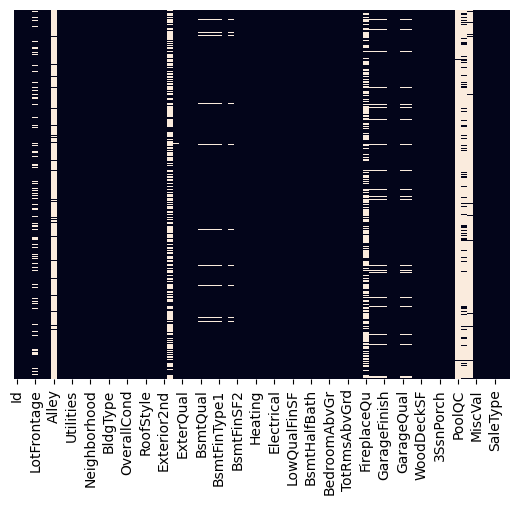

In [5]:
# Visualizacion de valores NaN por columna
import seaborn as sns
sns.heatmap(df.isnull(), yticklabels = False, cbar = False)
df.columns[df.isna().any()]

**Valores NaN **


La presencia de valores NaN podria significar varias cosas , pero depende mucho del tipo de variables . Los valores NaN podrian ser resultados de una mala carga de datos o tambien la ausencia de esa caracteristica en la casa por ejemplo PoolQC la cantidad de valores NaN podrian estar indicando que la vivienda no cuenta con Pileta.

Para esta primera fase de exploracion  , analizar estos valores NaN nos ayudaran para cuando tengamos que hacer el pre-presesamiento e imputacion de valores , de manera adecuada .

Como bien mesione antes , la presencia de valores NaN podria significar la ausencia de la caracteristica  . Un ejmplo claro de ausencia es con las varaibles numericas y categoricas que nos describen el Garage de la propiedad , estas tienen algo en comun , todas tiene 81 valores NaN , pero no por mala carga de datos sino por Ausencia de Garage .
Algo similar sucede con las varaibles que nos dan info del Sotano de la propiedad BsmtCond , BsmtQual , tienen en comun 37 valores faltantes porque no tiene sotano la casa .


En cambio Electrical , que es una variable que nos dice que tipo de energia usa la casa , posee solo 1 valor null posiblemente por mala carga de datos.


Aca un punto clave tambien es ver que % de valores NaN tiene la variable y analizar si brinda infromacion util para el modelo o no . Por ejemplo PoolQC podria significar la ausencia de pileta , pero al tener el 99% de los registros NaN seria similar a que la variable no existiera.


# Variables Categoricas (Analisis Univariado)

En este analisis  , voy a analizar como es la distribucion de las distintas categorias en el conjunto de datos . Esto me permitira sacar informacion util . Como cual es barrio con mas casas , Cual es el tipo de Calle mas habitual , cual es tipo de casa mas frecuente ect .

In [6]:
#Librerias
import statsmodels.api as sm
import seaborn as sns
import pandas as pd
import numpy as np
import math
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
from scipy import stats

In [7]:
#Separo las varialbes por tipos
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = df.select_dtypes(include=['object']).columns


/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:718: UserWarning: Using the countplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


<Figure size 1500x1000 with 0 Axes>

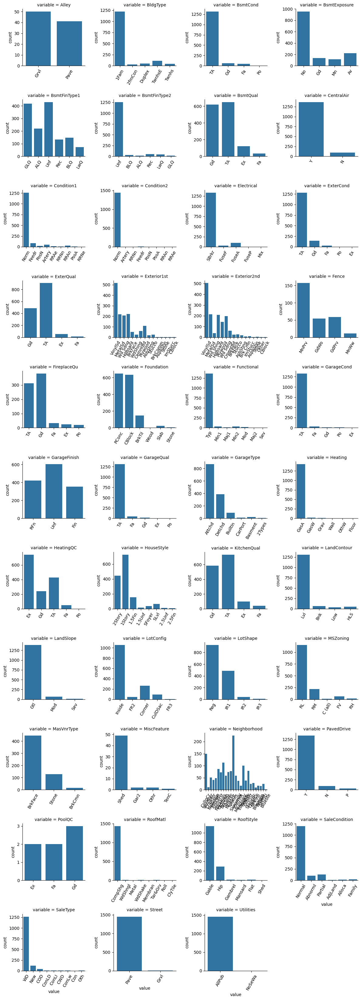

In [8]:

# Count plots of categorical features
plt.figure(figsize=(15, 10))
f = pd.melt(df, value_vars=sorted(cat_cols))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False)
plt.xticks(rotation='vertical')
g = g.map(sns.countplot, 'value')
[plt.setp(ax.get_xticklabels(), rotation=60) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

Como mensione antes , aca queremos ver que carateristicas son las mas frecuentes y cuales no tanto . Y saque algunos insaights


1.   Condition1 y Condition2 - el 99% del conjunto nos indica que la condicion2 es Norm si es que la casa cuenta con mas de 1 condicion . Pero los casos "Raros" donde la condicion no es Norm podrian ser un fuerte predictor.


2. Hay muchas variables categoricas que son ordinales ( es decir tienen un orden logico y esta puntuando algun aspecto de la casa) . Segun mis conocimientos esas variables lo recomendable seria tranformalas a Numericas discretas .  Estas varaibles a transformar son Aquellas con los siguentes valores ( Gd , Ta , Fa , Po , Ex ) quedarian como ( 1 , 2 ,3 ,4 ,5 ) donde cada valor tiene un significado logico.
           
3. Varibles con el 99%  con la misma frecuencia del valor Stree(Pave) , Utillitis(AllPub) , RooftMat(CompShg) , Heating(GasA) , CentralAir(Y) .

4. MsZoning , hay un aplio numero de registros con un valor RL

5. Electrical presenta una alta frecuencia en valores SBrKr

6. La condicion de venta mas frecuentes es Normal .



In [9]:
for col in cat_cols:
    print(f"\n📌 Columna: {col}")
    freq = df[col].value_counts(dropna=False)
    pct = (df[col].value_counts(dropna=False, normalize=True) * 100).round(2)
    summary = pd.DataFrame({'Frecuencia': freq, 'Porcentaje (%)': pct})
    display(summary)


📌 Columna: MSZoning


,Frecuencia,Porcentaje (%)
MSZoning,,
RL,1151,78.84
RM,218,14.93
FV,65,4.45
RH,16,1.10
C (all),10,0.68



📌 Columna: Street


,Frecuencia,Porcentaje (%)
Street,,
Pave,1454,99.59
Grvl,6,0.41



📌 Columna: Alley


,Frecuencia,Porcentaje (%)
Alley,,
NaN,1369,93.77
Grvl,50,3.42
Pave,41,2.81



📌 Columna: LotShape


,Frecuencia,Porcentaje (%)
LotShape,,
Reg,925,63.36
IR1,484,33.15
IR2,41,2.81
IR3,10,0.68



📌 Columna: LandContour


,Frecuencia,Porcentaje (%)
LandContour,,
Lvl,1311,89.79
Bnk,63,4.32
HLS,50,3.42
Low,36,2.47



📌 Columna: Utilities


,Frecuencia,Porcentaje (%)
Utilities,,
AllPub,1459,99.93
NoSeWa,1,0.07



📌 Columna: LotConfig


,Frecuencia,Porcentaje (%)
LotConfig,,
Inside,1052,72.05
Corner,263,18.01
CulDSac,94,6.44
FR2,47,3.22
FR3,4,0.27



📌 Columna: LandSlope


,Frecuencia,Porcentaje (%)
LandSlope,,
Gtl,1382,94.66
Mod,65,4.45
Sev,13,0.89



📌 Columna: Neighborhood


,Frecuencia,Porcentaje (%)
Neighborhood,,
NAmes,225,15.41
CollgCr,150,10.27
OldTown,113,7.74
Edwards,100,6.85
Somerst,86,5.89
Gilbert,79,5.41
NridgHt,77,5.27
Sawyer,74,5.07
NWAmes,73,5.00



📌 Columna: Condition1


,Frecuencia,Porcentaje (%)
Condition1,,
Norm,1260,86.30
Feedr,81,5.55
Artery,48,3.29
RRAn,26,1.78
PosN,19,1.30
RRAe,11,0.75
PosA,8,0.55
RRNn,5,0.34
RRNe,2,0.14



📌 Columna: Condition2


,Frecuencia,Porcentaje (%)
Condition2,,
Norm,1445,98.97
Feedr,6,0.41
Artery,2,0.14
RRNn,2,0.14
PosN,2,0.14
PosA,1,0.07
RRAn,1,0.07
RRAe,1,0.07



📌 Columna: BldgType


,Frecuencia,Porcentaje (%)
BldgType,,
1Fam,1220,83.56
TwnhsE,114,7.81
Duplex,52,3.56
Twnhs,43,2.95
2fmCon,31,2.12



📌 Columna: HouseStyle


,Frecuencia,Porcentaje (%)
HouseStyle,,
1Story,726,49.73
2Story,445,30.48
1.5Fin,154,10.55
SLvl,65,4.45
SFoyer,37,2.53
1.5Unf,14,0.96
2.5Unf,11,0.75
2.5Fin,8,0.55



📌 Columna: RoofStyle


,Frecuencia,Porcentaje (%)
RoofStyle,,
Gable,1141,78.15
Hip,286,19.59
Flat,13,0.89
Gambrel,11,0.75
Mansard,7,0.48
Shed,2,0.14



📌 Columna: RoofMatl


,Frecuencia,Porcentaje (%)
RoofMatl,,
CompShg,1434,98.22
Tar&Grv,11,0.75
WdShngl,6,0.41
WdShake,5,0.34
Metal,1,0.07
Membran,1,0.07
Roll,1,0.07
ClyTile,1,0.07



📌 Columna: Exterior1st


,Frecuencia,Porcentaje (%)
Exterior1st,,
VinylSd,515,35.27
HdBoard,222,15.21
MetalSd,220,15.07
Wd Sdng,206,14.11
Plywood,108,7.40
CemntBd,61,4.18
BrkFace,50,3.42
WdShing,26,1.78
Stucco,25,1.71



📌 Columna: Exterior2nd


,Frecuencia,Porcentaje (%)
Exterior2nd,,
VinylSd,504,34.52
MetalSd,214,14.66
HdBoard,207,14.18
Wd Sdng,197,13.49
Plywood,142,9.73
CmentBd,60,4.11
Wd Shng,38,2.60
Stucco,26,1.78
BrkFace,25,1.71



📌 Columna: MasVnrType


,Frecuencia,Porcentaje (%)
MasVnrType,,
NaN,872,59.73
BrkFace,445,30.48
Stone,128,8.77
BrkCmn,15,1.03



📌 Columna: ExterQual


,Frecuencia,Porcentaje (%)
ExterQual,,
TA,906,62.05
Gd,488,33.42
Ex,52,3.56
Fa,14,0.96



📌 Columna: ExterCond


,Frecuencia,Porcentaje (%)
ExterCond,,
TA,1282,87.81
Gd,146,10.00
Fa,28,1.92
Ex,3,0.21
Po,1,0.07



📌 Columna: Foundation


,Frecuencia,Porcentaje (%)
Foundation,,
PConc,647,44.32
CBlock,634,43.42
BrkTil,146,10.00
Slab,24,1.64
Stone,6,0.41
Wood,3,0.21



📌 Columna: BsmtQual


,Frecuencia,Porcentaje (%)
BsmtQual,,
TA,649,44.45
Gd,618,42.33
Ex,121,8.29
NaN,37,2.53
Fa,35,2.40



📌 Columna: BsmtCond


,Frecuencia,Porcentaje (%)
BsmtCond,,
TA,1311,89.79
Gd,65,4.45
Fa,45,3.08
NaN,37,2.53
Po,2,0.14



📌 Columna: BsmtExposure


,Frecuencia,Porcentaje (%)
BsmtExposure,,
No,953,65.27
Av,221,15.14
Gd,134,9.18
Mn,114,7.81
NaN,38,2.60



📌 Columna: BsmtFinType1


,Frecuencia,Porcentaje (%)
BsmtFinType1,,
Unf,430,29.45
GLQ,418,28.63
ALQ,220,15.07
BLQ,148,10.14
Rec,133,9.11
LwQ,74,5.07
NaN,37,2.53



📌 Columna: BsmtFinType2


,Frecuencia,Porcentaje (%)
BsmtFinType2,,
Unf,1256,86.03
Rec,54,3.70
LwQ,46,3.15
NaN,38,2.60
BLQ,33,2.26
ALQ,19,1.30
GLQ,14,0.96



📌 Columna: Heating


,Frecuencia,Porcentaje (%)
Heating,,
GasA,1428,97.81
GasW,18,1.23
Grav,7,0.48
Wall,4,0.27
OthW,2,0.14
Floor,1,0.07



📌 Columna: HeatingQC


,Frecuencia,Porcentaje (%)
HeatingQC,,
Ex,741,50.75
TA,428,29.32
Gd,241,16.51
Fa,49,3.36
Po,1,0.07



📌 Columna: CentralAir


,Frecuencia,Porcentaje (%)
CentralAir,,
Y,1365,93.49
N,95,6.51



📌 Columna: Electrical


,Frecuencia,Porcentaje (%)
Electrical,,
SBrkr,1334,91.37
FuseA,94,6.44
FuseF,27,1.85
FuseP,3,0.21
Mix,1,0.07
NaN,1,0.07



📌 Columna: KitchenQual


,Frecuencia,Porcentaje (%)
KitchenQual,,
TA,735,50.34
Gd,586,40.14
Ex,100,6.85
Fa,39,2.67



📌 Columna: Functional


,Frecuencia,Porcentaje (%)
Functional,,
Typ,1360,93.15
Min2,34,2.33
Min1,31,2.12
Mod,15,1.03
Maj1,14,0.96
Maj2,5,0.34
Sev,1,0.07



📌 Columna: FireplaceQu


,Frecuencia,Porcentaje (%)
FireplaceQu,,
NaN,690,47.26
Gd,380,26.03
TA,313,21.44
Fa,33,2.26
Ex,24,1.64
Po,20,1.37



📌 Columna: GarageType


,Frecuencia,Porcentaje (%)
GarageType,,
Attchd,870,59.59
Detchd,387,26.51
BuiltIn,88,6.03
NaN,81,5.55
Basment,19,1.30
CarPort,9,0.62
2Types,6,0.41



📌 Columna: GarageFinish


,Frecuencia,Porcentaje (%)
GarageFinish,,
Unf,605,41.44
RFn,422,28.90
Fin,352,24.11
NaN,81,5.55



📌 Columna: GarageQual


,Frecuencia,Porcentaje (%)
GarageQual,,
TA,1311,89.79
NaN,81,5.55
Fa,48,3.29
Gd,14,0.96
Ex,3,0.21
Po,3,0.21



📌 Columna: GarageCond


,Frecuencia,Porcentaje (%)
GarageCond,,
TA,1326,90.82
NaN,81,5.55
Fa,35,2.40
Gd,9,0.62
Po,7,0.48
Ex,2,0.14



📌 Columna: PavedDrive


,Frecuencia,Porcentaje (%)
PavedDrive,,
Y,1340,91.78
N,90,6.16
P,30,2.05



📌 Columna: PoolQC


,Frecuencia,Porcentaje (%)
PoolQC,,
NaN,1453,99.52
Gd,3,0.21
Ex,2,0.14
Fa,2,0.14



📌 Columna: Fence


,Frecuencia,Porcentaje (%)
Fence,,
NaN,1179,80.75
MnPrv,157,10.75
GdPrv,59,4.04
GdWo,54,3.70
MnWw,11,0.75



📌 Columna: MiscFeature


,Frecuencia,Porcentaje (%)
MiscFeature,,
NaN,1406,96.30
Shed,49,3.36
Gar2,2,0.14
Othr,2,0.14
TenC,1,0.07



📌 Columna: SaleType


,Frecuencia,Porcentaje (%)
SaleType,,
WD,1267,86.78
New,122,8.36
COD,43,2.95
ConLD,9,0.62
ConLI,5,0.34
ConLw,5,0.34
CWD,4,0.27
Oth,3,0.21
Con,2,0.14



📌 Columna: SaleCondition


,Frecuencia,Porcentaje (%)
SaleCondition,,
Normal,1198,82.05
Partial,125,8.56
Abnorml,101,6.92
Family,20,1.37
Alloca,12,0.82
AdjLand,4,0.27


**Aquellas variables con un alto % de valores NaN (>70%) , seria recomendable eliminarlas , ya que el modelo no sacara info util de estas.**

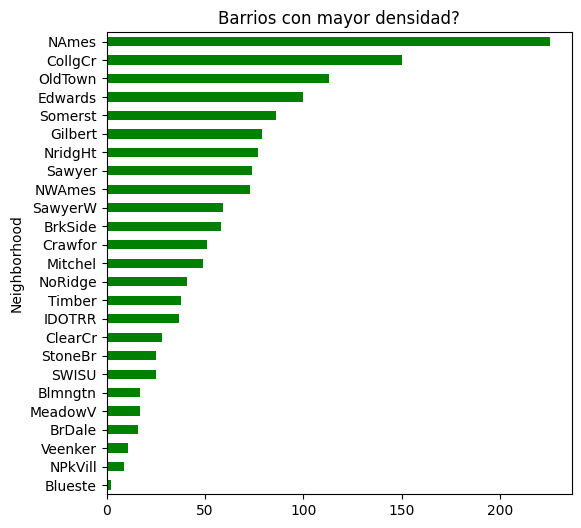

In [10]:
# Donde hay mayor concentracion de casa ?
df.groupby('Neighborhood').Id.count().\
    sort_values().\
    plot(kind='barh', figsize=(6,6), color="green")
plt.title('Barrios con mayor densidad?')
plt.show()

La mayoria de las casas que se vendieron  , se encuentran en los barrios Names , CollgCr , OldTown , Edwards . Podrian ser estas las mas demandadas o las mas economicas  estaria bueno analizar el precio promedio por barrio  y ver si realmente el lugar inflije en el precio . Esto revelara el dicho imobiliario de que la ubicacion es el precio  .


---

Aca podriamos complementar el data set con las caracteristicas adicionales del barrio , por ejemplo paradas de autobuses , numero de habitantes , cantidad de hospitales , ect . Podrian ser variables con alto poder predictivo.





# Variables Numericas ( Analisis Univariado )

## Variable Objetivo ( SalePrice)

Lo mas importante es ver como de distribuyen los valores de las casas . Para poder lograr entender mas el conjunto de datos . Una buena practica es hacerse preguntas sobre esta variable.


*   Que tan caras son las casas ?

*   En promedio cuanto cuesta una casa ?

*  De verdad sale tanto una casa ?


La casa mas economica es de  $34,900 y  la mas cara $755,000
El precio promedio de una casa es  $180,921, y su media ronda en $163,000


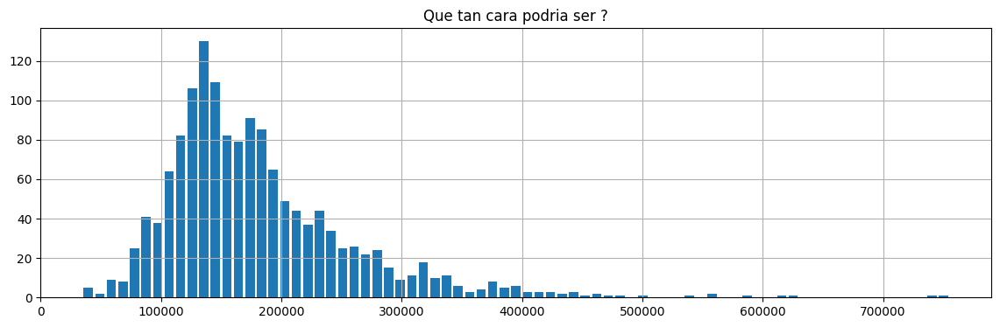

In [11]:

print('La casa mas economica es de  ${:,.0f} y  la mas cara ${:,.0f}'.format(
    df.SalePrice.min(), df.SalePrice.max()))
print('El precio promedio de una casa es  ${:,.0f}, y su media ronda en ${:,.0f}'.format(
    df.SalePrice.mean(), df.SalePrice.median()))
df.SalePrice.hist(bins=75, rwidth=.8, figsize=(14,4))
plt.title('Que tan cara podria ser ?')
plt.show()

In [12]:
# Estadisticas
df['SalePrice'].describe()

,SalePrice
count,1460.000000
mean,180921.195890
std,79442.502883
min,34900.000000
25%,129975.000000
50%,163000.000000
75%,214000.000000
max,755000.000000


Gracias , Gracias ,Gracias . Algo muy bueno es que no tenemos valores igual a 0$  . Estos es algo genial ya que no tendremos que modificar ni imputar ningun valor . Pero realmente una casa puede costar 755.000 mil dolares , Tendria que trabajar toda una vida :(

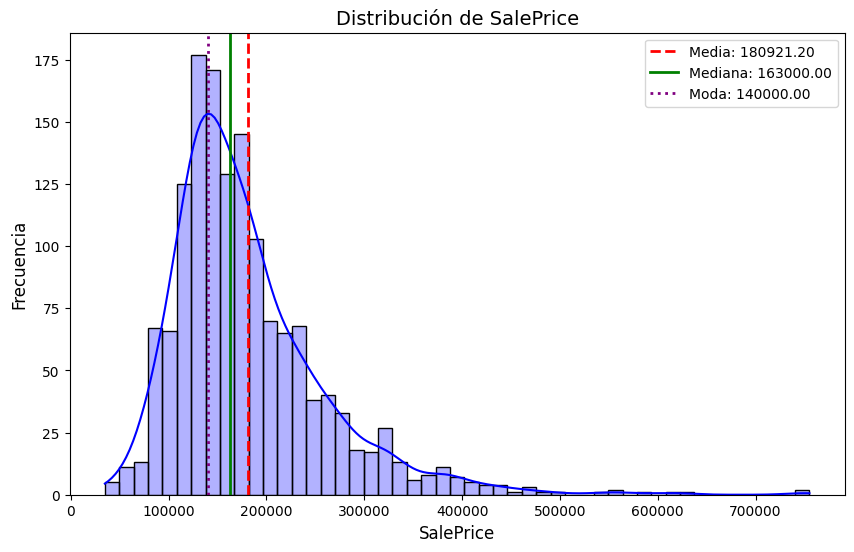

Skewness: 1.882876
Kurtosis: 6.536282


In [13]:

# Histograma for SalePrice with mean, median, and mode
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='SalePrice', kde=True, color='blue', alpha=0.3)
# Estadísticas
mean_val = df['SalePrice'].mean()
median_val = df['SalePrice'].median()
mode_result = stats.mode(df['SalePrice'], keepdims=True)
mode_val = mode_result.mode[0]
# Líneas verticales
plt.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Media: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='-', linewidth=2, label=f'Mediana: {median_val:.2f}')
plt.axvline(mode_val, color='purple', linestyle=':', linewidth=2, label=f'Moda: {mode_val:.2f}')

plt.title('Distribución de SalePrice', fontsize=14)
plt.xlabel('SalePrice', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.legend(fontsize=10)
plt.show()

# Kurtosis of SalePrice

print("Skewness: %f" % df['SalePrice'].skew())
print("Kurtosis: %f" % df['SalePrice'].kurt())

La varaible objetivo  , presenta diversos picos y una distribucion  mesocúrtica un poco sesgadas , con colas largas hacia la derecha . Esto quiere decir que hay valores muy altos  que generan un sesgo  .

Los picos mas altos se centran en la moda.

---



*   Aplicar una escala Log , podria normalizar esta distribucion
*   Una casa de mas de 700.000 mil dolares podria ser un outlier




## Otras variables numericas

La mas antigua es de  1872. La mas moderna es de 2010.


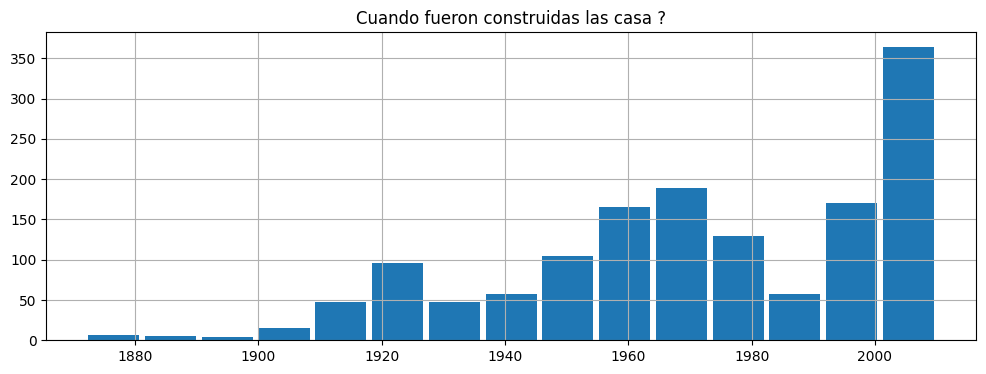

In [ ]:
# Que tan viejas o nuevas son las casas ?
print('La mas antigua es de  {}. La mas moderna es de {}.'.format(
    df.YearBuilt.min(), df.YearBuilt.max()))
df.YearBuilt.hist(bins=15, rwidth=.9, figsize=(12,4))
plt.title('Cuando fueron construidas las casa ?')
plt.show()

La actividad en el Area de Construccion en los 80' estuvo muy parada , apartir de los años 60' se nota que hubo un crecimiento en este rubro , siendo la epoca del 2000 con mayor actividad . Por ende la mayoria de las casa tienden a ser mas modernas.  


---

* En un analisis multivariado estara bueno analizar si las casa mas recientes tienden a tener un precio mayor.

* Analizar si agrupar por decadas es convenientes (FaceturesErnning)

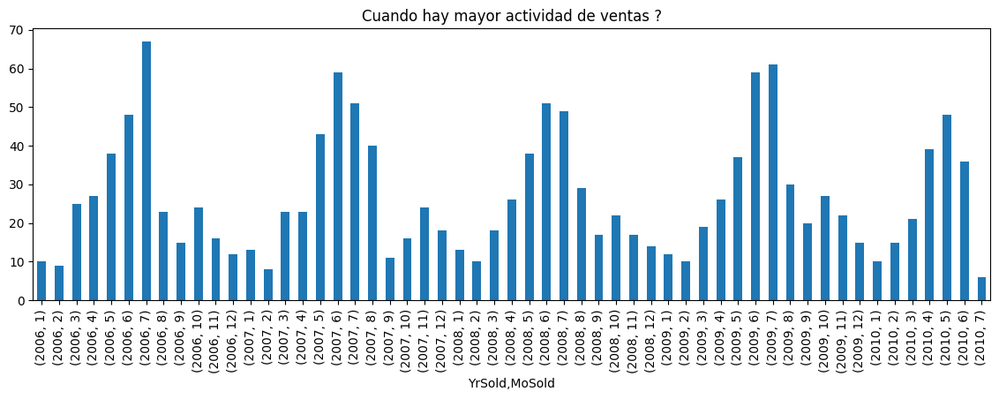

In [ ]:
# Cuando hay mayor actividad de ventas?
df.groupby(['YrSold','MoSold']).Id.count().plot(kind='bar', figsize=(14,4))
plt.title('Cuando hay mayor actividad de ventas ?')
plt.show()

Del siguiente grafico , podemos analizar en que epoca / que año , hay mayor actividad en las ventas de estas propiedades , Podemos obserar un comportamiento similiar en todos los años . Los meses de ventas con mayor pico siempre son los mismos Junio y Julio.


En el año 2006 fue cuando mayor pico de ventas hubo

La casa promedio tiene 1,515 M2, la media es de  1,464 M2
La casa mas grande es de  5,642 M2, La mas pequeña  334 M2


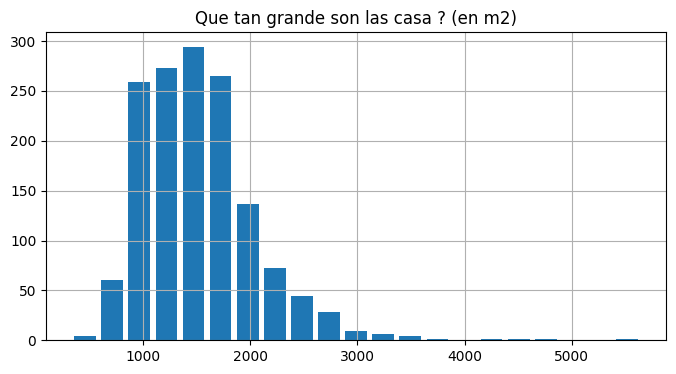

In [ ]:
print('La casa promedio tiene {:,.0f} M2, la media es de  {:,.0f} M2'.format(
    df.GrLivArea.mean(), df.GrLivArea.median()))
print('La casa mas grande es de  {:,.0f} M2, La mas pequeña  {:,.0f} M2'.format(
    df.GrLivArea.max(), df.GrLivArea.min()))
df.GrLivArea.hist(bins=21, rwidth=.8, figsize=(8,4))
plt.title('Que tan grande son las casa ? (en m2)')
plt.show()

* El dataSet cuenta con un aplio rango en cuestion de M2 de una casa ( 300 a 6000 M2 )
* Algo llamativo es que en el data set contamos con casa gigantescas de hasta mas de 5 mil M2 . Una vivienda promedio es de 1,500 M2 , muy cercano a la moda .

* Abria que analizar si relamnte una casa puede tener tantos M2 o si se trata de un outilier . Una manera sensilla seria analizar si el precio esta dentro de los estandares .

* Los datos se encuentan un poco sesgados a la derecha debido a las casa grandes

Lote promedio 10,517 m2 , La media 9,478 m2
EL lote mas grande  215,245 m2 ,  el mas pequeño 1,300 sq ft


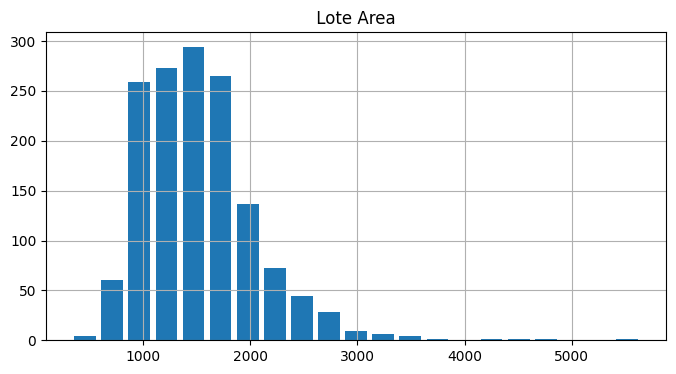

In [ ]:
# Tamaño de los Lotes
print('Lote promedio {:,.0f} m2 , La media {:,.0f} m2'.format(
    df.LotArea.mean(), df.LotArea.median()))
print('EL lote mas grande  {:,.0f} m2 ,  el mas pequeño {:,.0f} sq ft'.format(
    df.LotArea.max(), df.LotArea.min()))
df.GrLivArea.hist(bins=21, rwidth=.8, figsize=(8,4))
plt.title(' Lote Area ')
plt.show()

* Aca hay un alto sesgo hacia la derecha , tenemos lotes de mas de 200 mil m2 . Lo mas probable es normalizar esta variable aplicando escala log . Y analizar los outliers , ver si son datos reales o datos erroneos .

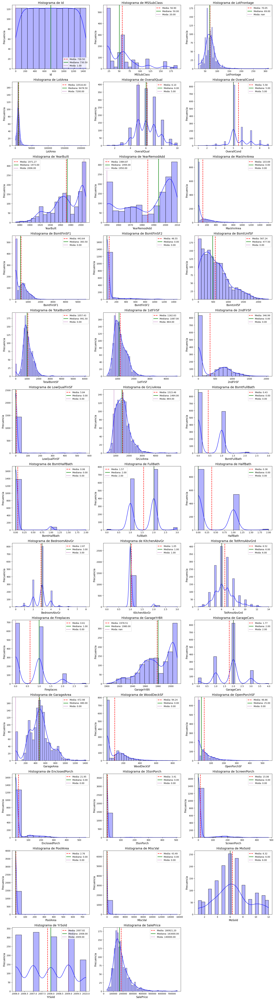

In [ ]:
import math
# Número de columnas por fila
cols_per_row = 3
num_vars = len(num_cols)
num_rows = math.ceil(num_vars / cols_per_row)
plt.figure(figsize=(6 * cols_per_row, 5 * num_rows))  # Ajustar tamaño según filas y columnas
for i, col in enumerate(num_cols):
    plt.subplot(num_rows, cols_per_row, i + 1)
    sns.histplot(data=df, x=col, kde=True, color='blue', alpha=0.3)

    # Estadísticas
    mean_val = df[col].mean()
    median_val = df[col].median()
    mode_result = stats.mode(df[col], keepdims=True)
    mode_val = mode_result.mode[0]

    # Líneas verticales
    plt.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Media: {mean_val:.2f}')
    plt.axvline(median_val, color='green', linestyle='-', linewidth=2, label=f'Mediana: {median_val:.2f}')
    plt.axvline(mode_val, color='purple', linestyle=':', linewidth=2, label=f'Moda: {mode_val:.2f}')

    plt.title(f'Histograma de {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)
    plt.legend(fontsize=10)

plt.tight_layout()
plt.show()


Aca Podemos ver un vistazo global de las variables Numericas , algunas ya analizamos. Algunas colmunas son inesesarias para el analisis como "Id".


*   Columnas que son derivadas de otras columnas . GrLivArea , BsmtTotalArea

GrLiveArea =    1stFlrSf + 2ndFlrSF +  LowQualFinSF

TotalBsmtSF = BsmtFinSf1 + BsmtFinSf2 + BsmtUnfSf


*  Algunas variables , aplicarle escala log , similar a lo que mencione anterior mente con SalePrice , podrian tener una distribucion mas sercana a la normal , ya que hay algunas variables que presentan colas largas hacia la derecha


Esas variables son las siguientes

*   LotFrontage, LotArea, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, GrLivAre, GarageArea , SalePrice



---



*  Variables de conteo , no son recomendadas traformarlas a escala log

 estas variables son : BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, TotalRmsAbvGr, Fireplaces, GarageCars



[Porque y Cuando escalar variables ](https://codificandobits.com/tutorial/por-que-cuando-escalar-los-datos/)




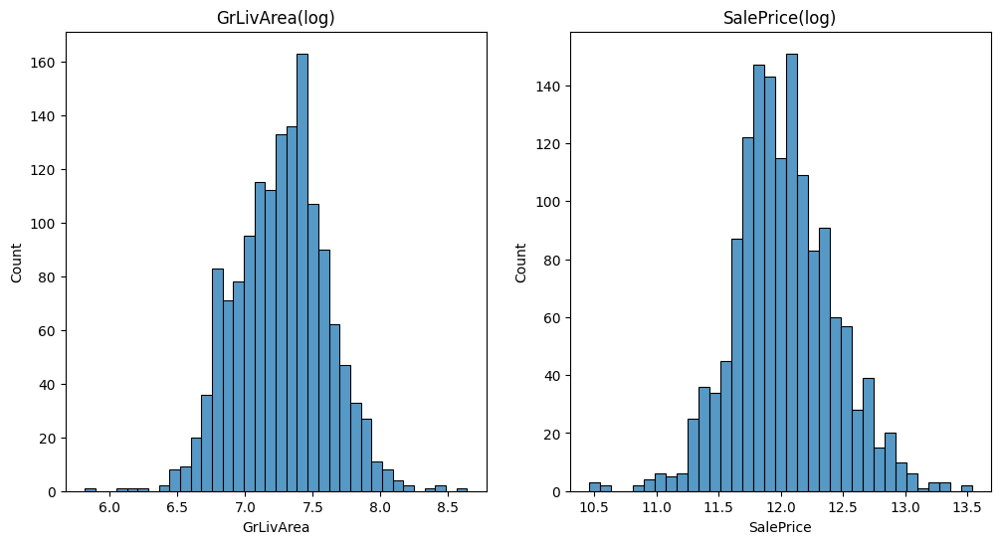

In [ ]:
plt.figure(figsize=(12,6))
plt.subplot(121)
sns.histplot(x=np.log1p(df.GrLivArea) )
plt.title("GrLivArea(log)")

plt.subplot(122)
sns.histplot(x=np.log1p(df.SalePrice))
plt.title("SalePrice(log)")
plt.show()

# Resumen de esta primera fase



---


Antes de continuar con  los analisis Bivariados y MultiVaridos , que nos permitiran ver cuales son las variables mas correlacionadas , cuales tiene mayor poder predictivo ante nuesta variable objetivo .

La siguiente fase de mi flujo de trabajo iniciare un prosesamiento de datos que ira de la siguiente forma



1.   Traramiento de valores NaN

* Eliminar aquellas columnas un porcentaje de valores Nan mayor a 60% y la columna Id inesesaria para el analisis.

* Imputar una categoria "Missing" a las variables categoricas nominales .

* Transformar las variables categoricas ordinales a numericas .

* Trasformar la variable numerica ( MSSubClass) a numerica ya que esta categorizando una casa.


* Imputar variables numericas con valores NaN a 0 . En algunos casos donde la varible tiene unos pocos valores NaN se imputara con la media del vecinadrio (LotFrontege)


2.  Trasformaciones Logaritmicas  a las variables que mencionamos arriba con colas sesgadas a la derecha . ( A expcion de las variables numericas de conteo )



3. Outliers  ---- Como estuvimos observando hay propiedades extremadamente grandes . Dependiendo del resultado de un analisis Bivariado  veremos si el precio es acorde a las dimenciones de la propiedad. De lo contrario se eliminaran aquellos registros "Extremos".



        **(nota) Este pre-prosesamiento inicial hay que replicarlo en el test.csv**



# Primer pre-prosesamiento


In [14]:
# Chequeo si hay rows que tengan muchos nan values
df.isnull().sum(axis=1).sort_values(ascending=False).head()

,0
1218,16
533,16
1011,16
39,16
520,15


Considerando que hay un total de 80 variables  , 13 valores Nan por columna no es tanto .

In [15]:
#Se remplazaron 8 valores NaN en 'MasVnrArea' por 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

In [16]:
# Rellena los valores NaN en 'MasVnrType' con la categoría 'Missing'
df['MasVnrType'] = df['MasVnrType'].fillna('Missing')
# Ahora, para los registros donde 'MasVnrType' es 'Missing',
# nos aseguramos de que 'MasVnrArea' sea 0
df.loc[df['MasVnrType'] == 'Missing', 'MasVnrArea'] = 0

In [17]:
# En 'LotFrontage'(Pies Lineales conectados a la propiedad ), rellenaremos los valores nulos con la mediana del vecindario
df['LotFrontage'] = df.groupby('Neighborhood')['LotFrontage'].transform(
    lambda x: x.fillna(x.median()))

In [18]:
# Calcular la moda de la variable Electrical
electrical_mode = df['Electrical'].mode()[0]
# Reemplazar el NaN con la moda
df['Electrical'].fillna(electrical_mode, inplace=True)
# Verificar que ya no hay NaN
print(df['Electrical'].isnull().sum())

0


/tmp/ipython-input-829468055.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Electrical'].fillna(electrical_mode, inplace=True)


In [19]:
# Recuento de registros con 0 Fireplaces / tienen q coincidir con el numero de NAn (690) en FireplaceQu (Chimenea). Ya que si la propiedad no tiene chimenea esta no puede tener valor en su calidad
num_fireplaces_zero = df[df['Fireplaces'] == 0].shape[0]

print(f"Number of records with 0 fireplaces: {num_fireplaces_zero}")
df["FireplaceQu"] = df["FireplaceQu"].fillna("Missing")

Number of records with 0 fireplaces: 690


In [20]:
# Lista de columnas categóricas con NaN
missing_col_val = [ "BsmtQual",
"BsmtCond",
"BsmtExposure",
"BsmtFinType1",
"BsmtFinType2",
"FireplaceQu",
"GarageType",
"GarageQual",
"GarageCond",
"GarageFinish",
"Alley",
"Fence",
"MiscFeature"


]

df[missing_col_val] = df[missing_col_val].fillna('Missing')

In [21]:
# Falta modificar el año del garage en los casos que la propieda no cuente con esta caracteristica , mi propuesta fue poner el año = 0
df['GarageYrBlt'] = df['GarageYrBlt'].fillna(0)

In [22]:
df["Fence"] = df["Fence"].fillna("Missing")

## Trasformacion de Numerica a Categoricas

In [23]:

df = df.replace({"MSSubClass" : {20 : "SC20", 30 : "SC30", 40 : "SC40", 45 : "SC45",
                                       50 : "SC50", 60 : "SC60", 70 : "SC70", 75 : "SC75",
                                       80 : "SC80", 85 : "SC85", 90 : "SC90", 120 : "SC120",
                                       150 : "SC150", 160 : "SC160", 180 : "SC180", 190 : "SC190"}})

## Tranformacion de Categoricas Ordinales a Numericas

In [24]:
# Alley
#df.Alley.replace({'Grvl':1, 'Pave':2 , "Missing":0}, inplace=True)

# Lot Shape
df.LotShape.replace({'Reg':1, 'IR1':2, 'IR2':3, 'IR3':4}, inplace=True)

# Land Contour
df.LandContour.replace({'Low':1, 'HLS':2, 'Bnk':3, 'Lvl':4}, inplace=True)

# Utilities
df.Utilities.replace({'ELO':1, 'NoSeWa':2, 'NoSewr':3, 'AllPub':4}, inplace=True)

# Land Slope
df.LandSlope.replace({'Sev':1, 'Mod':2, 'Gtl':3}, inplace=True)

# Exterior Quality
df.ExterQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5, 'Missing':0}, inplace=True)

# Exterior Condition
df.ExterCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5, 'Missing': 0}, inplace=True)

# Basement Quality
df.BsmtQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5, 'Missing': 0}, inplace=True)

# Basement Condition
df.BsmtCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5 , 'Missing': 0}, inplace=True)

# Basement Exposure
df.BsmtExposure.replace({'No':1, 'Mn':2, 'Av':3, 'Gd':4, 'Missing': 0}, inplace=True)

# Finished Basement 1 Rating
df.BsmtFinType1.replace({'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6, 'Missing': 0}, inplace=True)

# Finished Basement 2 Rating
df.BsmtFinType2.replace({'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6, 'Missing': 0}, inplace=True)

# Heating Quality and Condition
df.HeatingQC.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5, 'Missing': 0}, inplace=True)

# Kitchen Quality
df.KitchenQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5, 'Missing': 0}, inplace=True)

# Home functionality
df.Functional.replace({'Sal':1, 'Sev':2, 'Maj2':3, 'Maj1':4, 'Mod':5, 'Min2':6, 'Min1':7, 'Typ':8}, inplace=True)

# Fireplace Quality
df.FireplaceQu.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5 ,'Missing': 0}, inplace=True)

# Garage Finish
df.GarageFinish.replace({'Unf':1, 'RFn':2, 'Fin':3 , 'Missing': 0}, inplace=True)

# Garage Quality
df.GarageQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5 , 'Missing': 0}, inplace=True)

# Garage Condition
df.GarageCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5 , 'Missing': 0}, inplace=True)

# Paved Driveway
df.PavedDrive.replace({'N':1, 'P':2, 'Y':3, 'Missing': 0}, inplace=True)



/tmp/ipython-input-1999071158.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.LotShape.replace({'Reg':1, 'IR1':2, 'IR2':3, 'IR3':4}, inplace=True)
/tmp/ipython-input-1999071158.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.LotShape.replace({'Reg':1, 'IR1':2, 'IR2':3, 'IR3':4}, inplac

In [25]:
# Columnas con muchos valores NaN > 60%
df = df.drop(columns=["PoolQC","Id","Alley","MiscFeature"] )

## Resultado del pre-prosesamiento inicial

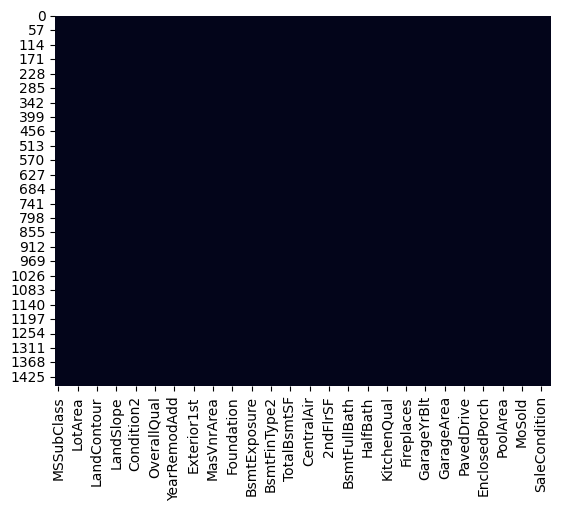

¡Genial! No quedan valores nulos en el DataFrame.


In [26]:
# Crea un DataFrame booleano para los valores nulos
null_data = pd.DataFrame(df.isnull())

# Visualiza el mapa de calor de los valores nulos
sns.heatmap(null_data, cbar=False)
plt.show()

# Verifica si aún quedan valores nulos
total_nulls = df.isnull().sum().sum()
if total_nulls == 0:
    print("¡Genial! No quedan valores nulos en el DataFrame.")
else:
    print(f"Aún quedan {total_nulls} valores nulos en el DataFrame.")

#  ¿ Transformaciones log ?

Antes de comenzar a aplicar tranformaciones log... Yo  por mucho tiempo me pregunte el para que y el porque se hace esto . Investigando averigue que las variables , no siempre tienen una distribucion normal , com vimos anteriormente , algunas variables presentan muchos valores pequeños y unos pocos muy grandes ( sesgo con colas hacia la derecha)


 Algunas variables como SalePrice, GrLivArea, GarageArea y LotFrontage, LotArea tienen valores muy pequeños y unos pocos muy grandes. Esto dificulta que el modelo aprenda correctamente.
Aplicar log ayuda a “aplanar” la distribución, equilibrando los valores grandes y pequeños, y hace que los modelos puedan predecir mejor sin que los extremos dominen la predicción.
Por eso usamos log solo en estas variables sesgadas a la derecha.

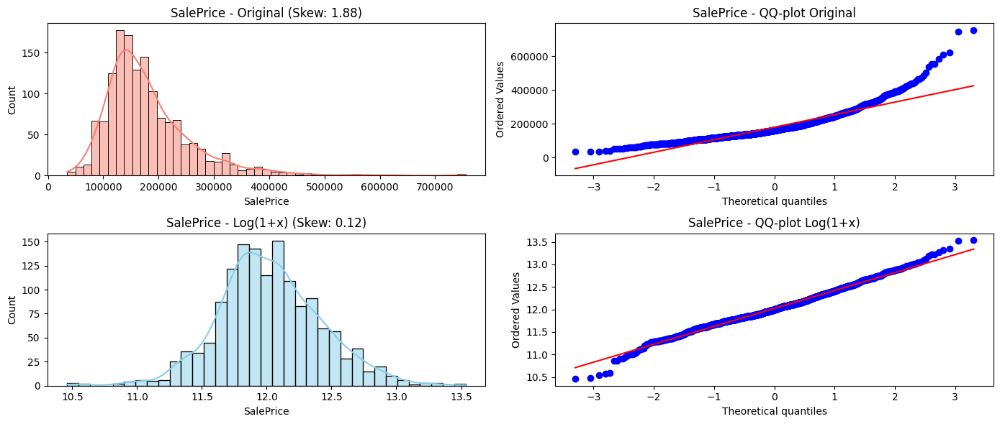

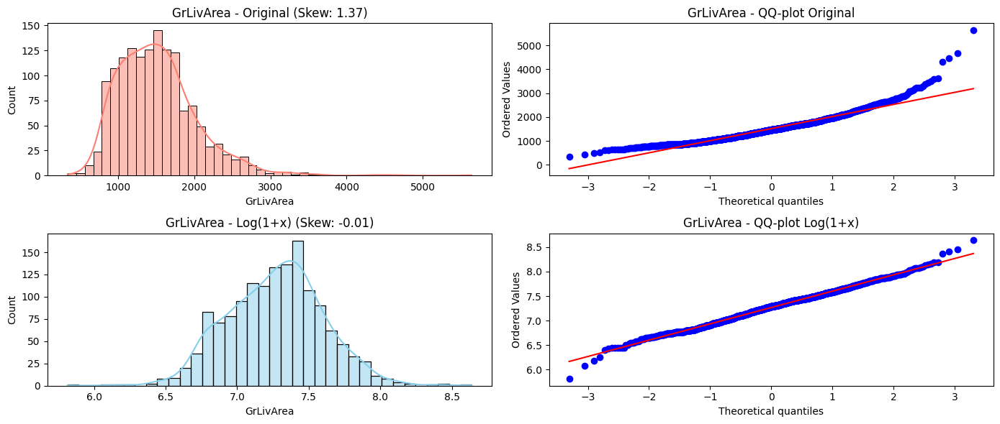

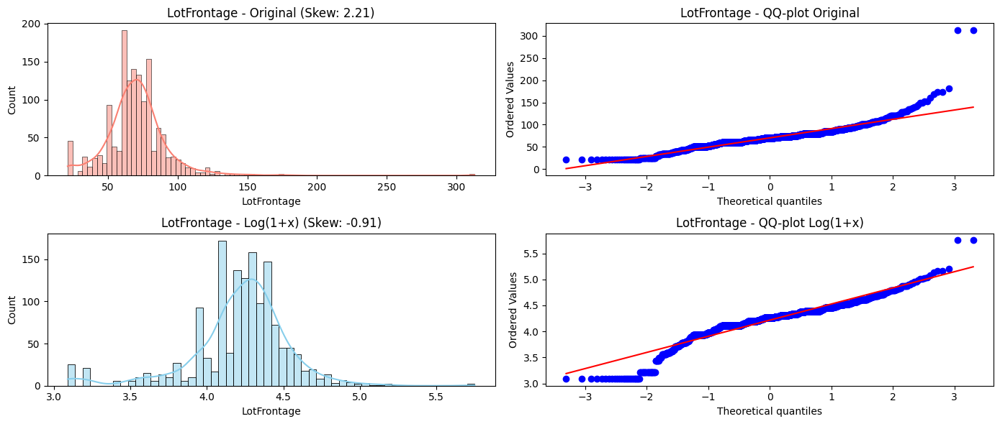

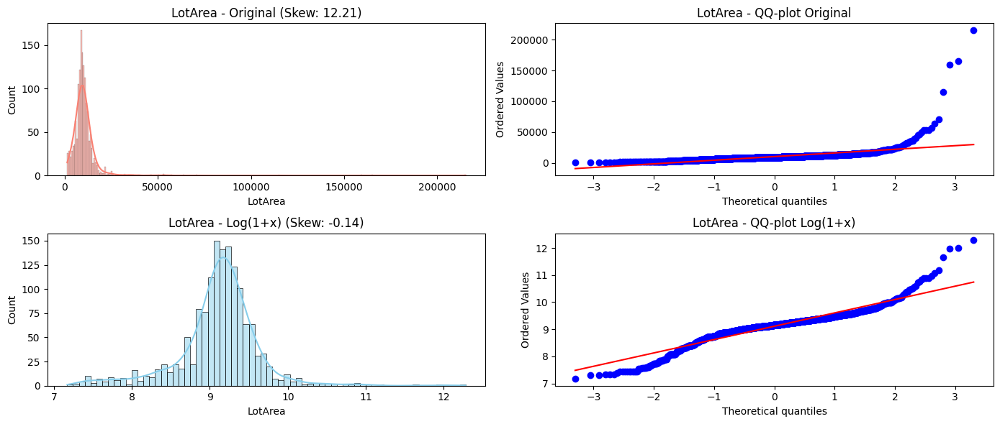

In [27]:
# Variables sesgadas a la derecha
vars_sesgadas = ["SalePrice", "GrLivArea", "LotFrontage", "LotArea"]
for var in vars_sesgadas:
    x = df[var].dropna()  # eliminar NaN

   # Calcular asimetría original y log
    skew_orig = x.skew()
    skew_log = np.log1p(x).skew()

    # Crear figura
    plt.figure(figsize=(14,6))

    # Histograma original
    plt.subplot(2,2,1)
    sns.histplot(x, kde=True, color="salmon")
    plt.title(f"{var} - Original (Skew: {skew_orig:.2f})")

    # QQ-plot original
    plt.subplot(2,2,2)
    stats.probplot(x, dist="norm", plot=plt)
    plt.title(f"{var} - QQ-plot Original")

    # Histograma log
    plt.subplot(2,2,3)
    sns.histplot(np.log1p(x), kde=True, color="skyblue")
    plt.title(f"{var} - Log(1+x) (Skew: {skew_log:.2f})")

    # QQ-plot log
    plt.subplot(2,2,4)
    stats.probplot(np.log1p(x), dist="norm", plot=plt)
    plt.title(f"{var} - QQ-plot Log(1+x)")

    plt.tight_layout()
    plt.show()

Al aplicar una escala logarítmica en variables que tienen una distribución sesgada hacia la derecha, logramos que sus valores se acerquen a una distribución normal.

Esto no solo hace que los gráficos (histograma y QQ-plot) se vean más simétricos, sino que también mejora el comportamiento en modelos lineales, porque:

Se reducen los valores extremos (outliers).

Los residuos se distribuyen de manera más uniforme.

El modelo puede captar mejor las relaciones entre las variable

/tmp/ipython-input-1522311255.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 0].set_xticklabels(["Sin", "Con"])


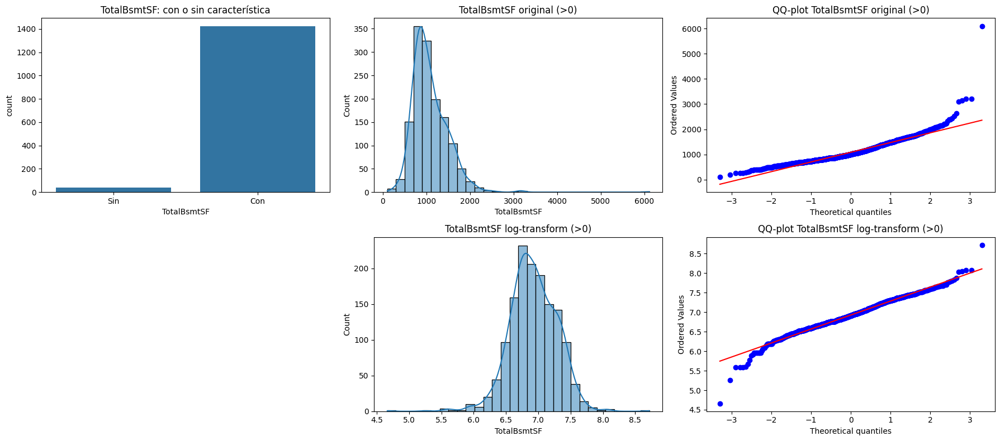

/tmp/ipython-input-1522311255.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 0].set_xticklabels(["Sin", "Con"])


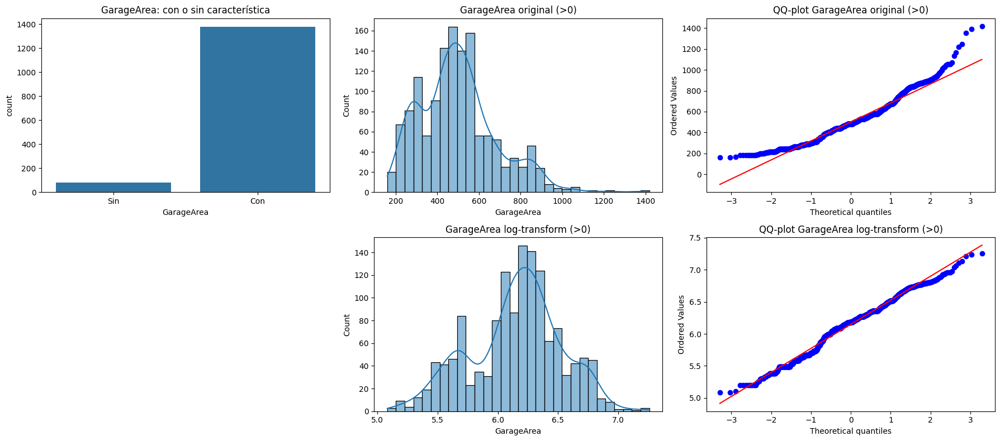

In [28]:
# Variables con sesgo a la izquierda , por tener muchos valores 0 (ausencia de la caracteristica )
# Conviene crear una variable binaria , para tratar los 0 como algo aparte y asi lograr aplicar log y ver si la variable se normalizo .
# Variables que  tienen muchos ceros
vars_zero = ["TotalBsmtSF", "GarageArea"]

for var in vars_zero:
    # Separar valores > 0
    data_pos = df.loc[df[var] > 0, var]

    fig, axes = plt.subplots(2, 3, figsize=(18, 8))

    # 1. Gráfico de barras: con/sin característica
    sns.countplot(x=(df[var] > 0).astype(int), ax=axes[0, 0])
    axes[0, 0].set_xticklabels(["Sin", "Con"])
    axes[0, 0].set_title(f"{var}: con o sin característica")

    # 2. Histograma original (>0)
    sns.histplot(data_pos, bins=30, kde=True, ax=axes[0, 1])
    axes[0, 1].set_title(f"{var} original (>0)")

    # 3. QQ-plot original (>0)
    stats.probplot(data_pos, dist="norm", plot=axes[0, 2])
    axes[0, 2].set_title(f"QQ-plot {var} original (>0)")

    # 4. Histograma log-transform (>0)
    sns.histplot(np.log1p(data_pos), bins=30, kde=True, ax=axes[1, 1])
    axes[1, 1].set_title(f"{var} log-transform (>0)")

    # 5. QQ-plot log-transform (>0)
    stats.probplot(np.log1p(data_pos), dist="norm", plot=axes[1, 2])
    axes[1, 2].set_title(f"QQ-plot {var} log-transform (>0)")

    # Ajuste de diseño
    axes[1, 0].axis("off")  # celda vacía solo para balancear
    plt.tight_layout()
    plt.show()


Genial otro indicio de que TotalBsmtSF y GarageArea , con tranformacion logaritmica tienen mejor comportamiento .

# Analisis Bivariado

## Variables Numericas

En este analisis lo primero sera realizar un grafico de dispercion por cada variable numerica sobre el target ( SalePrice) .

In [29]:
num_vars = df.select_dtypes(include=['int64', 'float64']).columns
col_vars =df.select_dtypes(include=['object']).columns

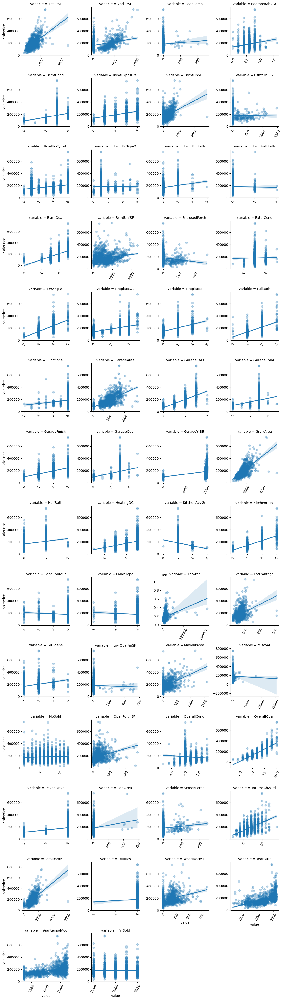

In [30]:
# Scatter plots of numerical features against SalePrice
f = pd.melt(df, id_vars=['SalePrice'], value_vars=sorted(num_vars))
g = sns.FacetGrid(f, col='variable', col_wrap=4, sharex=False, sharey=False)
plt.xticks(rotation='vertical')
g = g.map(sns.regplot, 'value', 'SalePrice', scatter_kws={'alpha':0.3})
[plt.setp(ax.get_xticklabels(), rotation=60) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()

Esta visualizacion global de las variables podemos observas , que muchas de ellas tienen una  correlacion positiva con el target . Hay muchas de ellas que a pesar que tienen una correlacion positiva , brindna informacion similar .

*   TotalRmsAbvGr es el total de habitaciones por encima del suelo sin contar los baños  por ende Beedroms , Kitchen forman parte de esta variable

*   TotalBsmtSF es el area total del sotano por ende las variables que miden el sotano (BsmtFinSF1 , BsmtFinSF2 , BsmtUfSF ) brindarian info similiar.



* Las variables que puntuan a las distintas caracteristicas de las casa la mayoria siempre tiene una correlacion positiva. Esto es algo logico ya que a mejor calidad y una mejor condicion las casas tienden a ser mas caras.


* Variables con muchas cantidades de 0 . Hay variables que nos estan indicando la ausencia de de la caracteristica . Pero su precio pareciera no afectar ya que tenemos por ejmplo  Alley el valor 0 indica la ausencia de cercado  . Donde el precio no parece verse afectada por esta caracteristica .




* Algunas variables seria bueno aplicar ingenieria para ver si juntas tienen mayor correlacion . Por ejemplo las varaibles que miden el espacio del porche (ScreenPorch , EnclosedPorch , 3SsnPorch , OpenPorchSF )



* Como mencionamos arriba aplicar escala Log a las siguientes variables podrian dar como resultado una mejor correlacion producto de tener una buena distribucion . Aquellas variables son SalePrice , TotalArea , LotFrontage , GrLiveArea ,

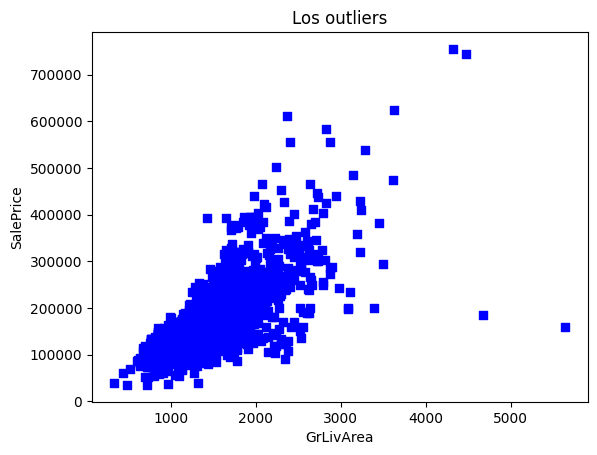

In [31]:
plt.scatter(df.GrLivArea, df.SalePrice, c = "blue", marker = "s")
plt.title("Los outliers")
plt.xlabel("GrLivArea")
plt.ylabel("SalePrice")
plt.show()


Segun la documentacion , los registros donde el Area total habitable es extrema , pero su precio no lo acompaña , se trata de casos extremos y hay que decidir si tenerlos en cuenta o no  , ya que podrian generar ruido en el modelo . Si dividimos el grafico en cuadrantes , el cuadrante inferior derecho se ven estos registros extremos donde el valor es bajo y si lo comparamos con el cuadrante superior derecho hay casas con las mismas dimenciones , pero mucho mas caros . Yo optare por seguir la recomendacion del autor del DataSet y eliminare aquellos donde GrLiveArea > 4000.

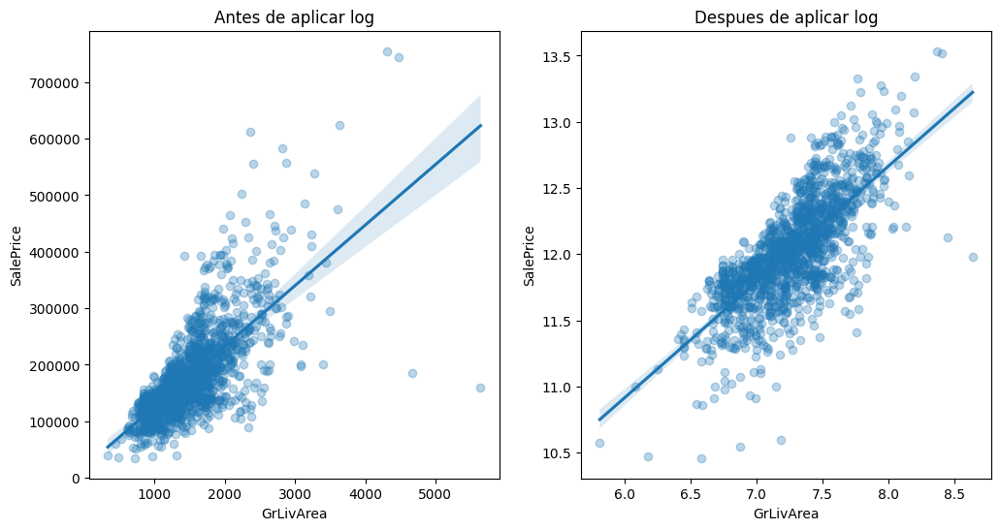

In [32]:
plt.figure(figsize=(12,6))
plt.subplot(121)
sns.regplot(x=df.GrLivArea, y=df.SalePrice, scatter_kws={'alpha':0.3})
plt.title('Antes de aplicar log')

plt.subplot(122)
sns.regplot(x=np.log1p(df.GrLivArea), y=np.log1p(df.SalePrice), scatter_kws={'alpha':0.3})
plt.title('Despues de aplicar log')
plt.show()


Sin dudas se nota una mejor comportamiento con la variable transformada

### Deteccion de valores Extremos (IQR)

In [33]:
import numpy as np

# Variable original (ejemplo con "SalePrice")
x = df["GrLivArea"].dropna()

# ---- Escala original ----
Q1_orig = np.percentile(x, 25)
Q3_orig = np.percentile(x, 75)
IQR_orig = Q3_orig - Q1_orig
lower_orig = Q1_orig - 1.5 * IQR_orig
upper_orig = Q3_orig + 1.5 * IQR_orig

# ---- Escala log ----
x_log = np.log1p(x)   # log(1+x) para evitar problemas con ceros
Q1_log = np.percentile(x_log, 25)
Q3_log = np.percentile(x_log, 75)
IQR_log = Q3_log - Q1_log
lower_log = Q1_log - 1.5 * IQR_log
upper_log = Q3_log + 1.5 * IQR_log

# ---- Resultados ----
print("---- Escala Original ----")
print("IQR:", IQR_orig)
print("Límite inferior:", lower_orig)
print("Límite superior:", upper_orig)

print("\n---- Escala Log ----")
print("IQR:", IQR_log)
print("Límite inferior:", lower_log)
print("Límite superior:", upper_log)


---- Escala Original ----
IQR: 647.25
Límite inferior: 158.625
Límite superior: 2747.625

---- Escala Log ----
IQR: 0.4526885338130153
Límite inferior: 6.351382197404983
Límite superior: 8.162136332657045


[Que hay que tener en cuenta , antes de eliminar outiliers ](https://procogia.com/interquartile-range-method-for-reliable-data-analysis/)

Aplicamos el metodo IQR para detectar valores atipicos en la variable GrLivArea  , sin dudas debos eliminar aquellos valores que el autor del DataSet nos recomendo (>4000) .



---
(nota) Solo lo aplique para esta variable , debido que el resto de valores atipicos podrian ser verdaderos y no valores mal imputados.


Para tener idea de que tan correlacionadas estan las variasbles numericas lo mejor seria graficar un mapa de calor junto con target. Donde se observara que tan correlacionadas estan las variables

In [34]:
# Eliminar registros donde GrLivArea > 4000
df = df[df["GrLivArea"] <= 4000]


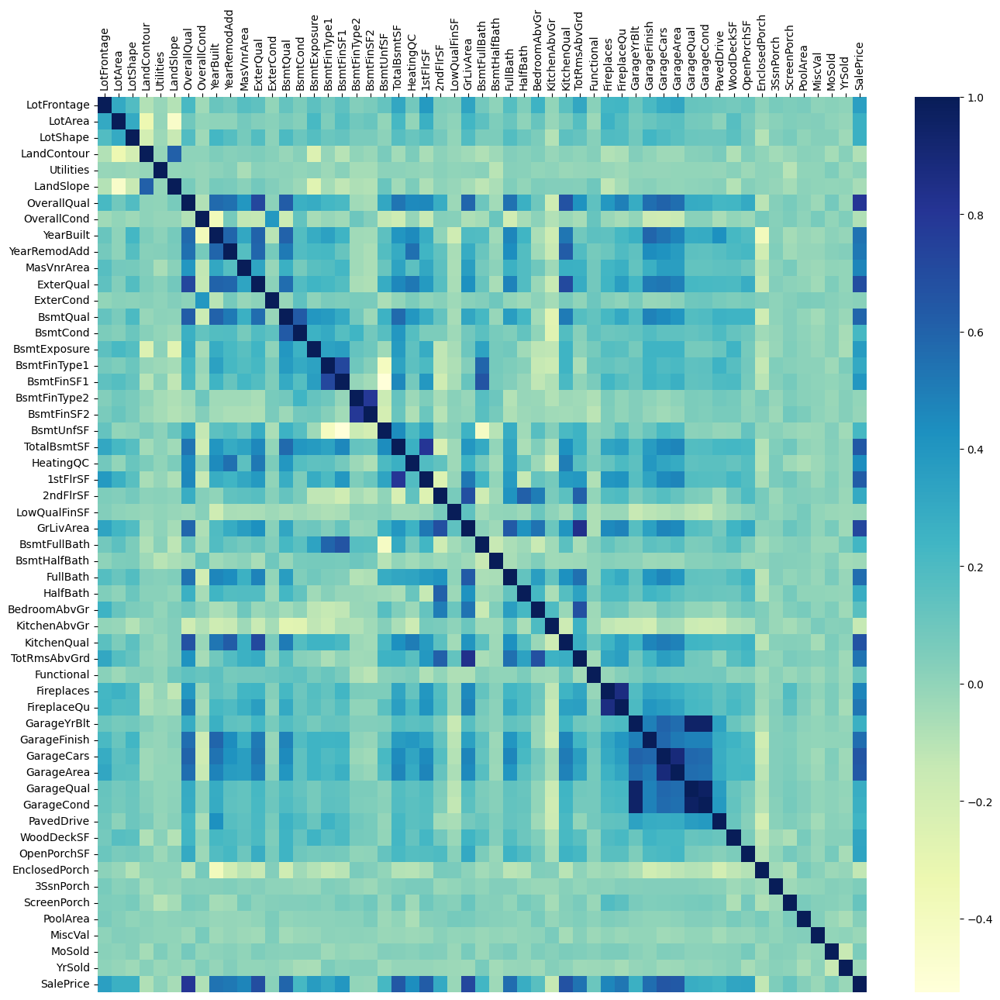

In [35]:


# Correlaciones y Multicolinealidad
corr = df[ num_vars].corr()
fig = plt.figure(figsize=(16,15) )
ax = fig.add_subplot(111)

sns.heatmap(corr,
           xticklabels=corr.columns.values,
           yticklabels=corr.index.values,
            cmap="YlGnBu")
ax.xaxis.tick_top()
plt.setp(ax.get_xticklabels(), rotation=90)
plt.show()


/tmp/ipython-input-3044228751.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot( x= corr.SalePrice[1:], y= corr.index[1:], orient='h',palette= colors )


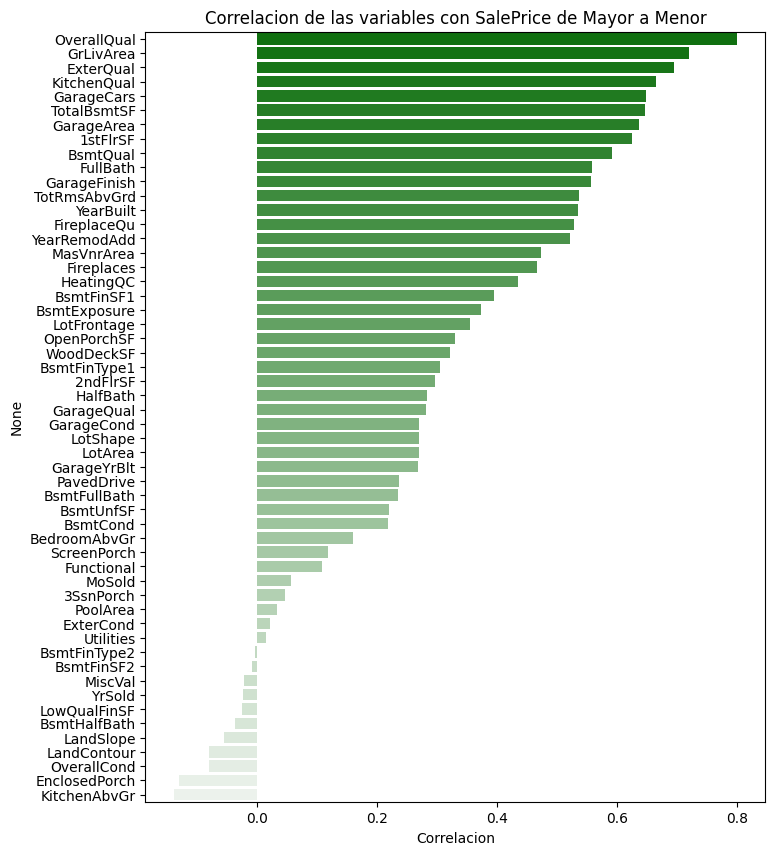

In [36]:
# Feature sorted by correlation to SalePrice, from positive to negative
colors = sns.light_palette("green", n_colors=len(corr)-1, reverse=True)
corr = corr.sort_values('SalePrice', ascending=False)
plt.figure(figsize=(8,10))
sns.barplot( x= corr.SalePrice[1:], y= corr.index[1:], orient='h',palette= colors )
plt.title('Correlacion de las variables con SalePrice de Mayor a Menor')
plt.xlabel('Correlacion')
plt.show()

**La Matrix de Correlacion Junto al targget **



*   Este grafico nos permite analizar que variables estan mas correlacionadas con nuestra variable objetivo : en otras palabras son los datos que cuando aumentan su valor  o disminuye estas impactan en el precio de venta .

*   Pero hay que tener cuidado y analizar que nuestras variables predictoras no esten correlacionadas entre si . Esto es a lo que llamamos Multicolinealidad([Info](https://www.maximaformacion.es/blog-ciencia-datos/que-es-la-multicolinealidad-y-por-que-es-un-problema/)) . Una manera de analizar esto es calculando el VIF([Info](https://www.datacamp.com/es/tutorial/variance-inflation-factor)) .Existen diversos metodos para manejar la multicolinealidad uno de ellos es PCA([info](https://www.geeksforgeeks.org/data-analysis/principal-component-analysis-pca/))



---


*   Las variables mas correlacionadas con el Targget son : OverallQual , GrLivArea , ExterQual , KitchenQC , GarageCars, GarageArea , ect


*   Pero dentro de esa lista observamos que existe multicolinealidad entre estas , por ejemplo GarageCars tiene alta correlacion con GarageArea y vicebersa . ExterQual , KitchenQC tambien estan correlacionadas entre si . Casi todas las variables que puntuan una caracteristica de la casa tienen una correlacion positiva con OverallQual(una de las variables con mayor poder)

* GarageYrBlt y YearBlt tiene alta correlacion , podria indicar que tanto el garage como la construcion de la casa se hicieron en el mismo momneto .

* Es logico que todas las variables de puntuacion esten correlacionadas con la puntuacion general de la casa . a mayor calidad y condicion de la cosina , calefaccion , revestimiento exterior ,ect , la puntuacion general de la casa va aumentar.

* TotRmsAbvGr es logico que este correlacionada con GrlivArea , ya que a mayor espacio en M2 , mayor cantidad de habitaciones.

* GrLivArea , esta compuesta por 1stFlrSF , 2stFlrSF y LowQualFinSF , por ende la correlacion de estas con GrLivArea es de esperar. Lo mismo sucede con las Variables que miden el sotano , tiene correlacion positiva fuerte con la variable que almacena el espacio total del sotano (TotalBsmtSF)


---


* En resumen nuestro data set contine un problema de Multicolinealidad ,
 lo que afectaria , al momento de querer responder que variable resulta ser la mas importante . Pero tener multicolinalidad no influye en las predicciones, ni en la precisión de las predicciones ni en las estadísticas de bondad de ajuste. Si el   objetivo principal es hacer predicciones y no necesita comprender el papel de cada variable independiente, no necesitas resolverla .

---


* Por esta misma razon es que cuando apliquemos igenieria de caracteristicas , debemos de estar antentos , por si queremos averiguar si la variable realmente resulta ser "mejor"

Modelos de regresion como Lasso o Ridge manejan bien la multicolinealidad [Lasso Regression y la Multicolinealidad ](https://towardsdatascience.com/when-to-use-lasso-regression-8a4c4b334fa8/)





## PCA

In [37]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Guardamos 'SalePrice' porque es lo que queremos predecir, no es un predictor.
sale_price = df['SalePrice']

# Excluimos 'SalePrice' que ya guardamos.
df_numeric = df.select_dtypes(include=['int64', 'float64']).drop(columns=['SalePrice'])

# Es buena idea guardar los nombres de las columnas para referencia futura
numeric_cols = df_numeric.columns

# 2. Estandarizar los datos
# Creamos una instancia del escalador. Esto asegura que todas las variables
# tengan la misma escala (media 0, desviación estándar 1).
scaler = StandardScaler()

# Ajustamos y transformamos los datos numéricos.
df_numeric_scaled = scaler.fit_transform(df_numeric)

print("¡Datos numéricos listos y estandarizados!")
print(f"Dimensiones de los datos escalados: {df_numeric_scaled.shape}")

¡Datos numéricos listos y estandarizados!
Dimensiones de los datos escalados: (1456, 54)


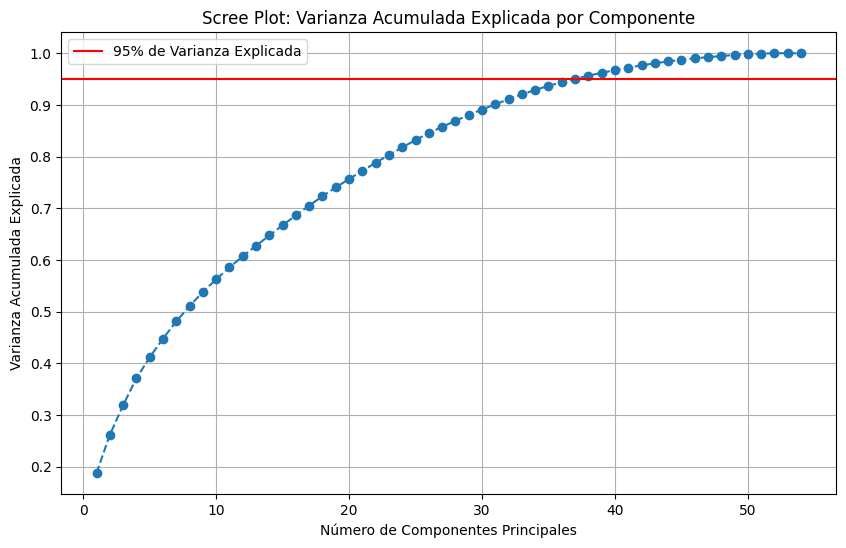

Necesitamos 37 componentes para explicar al menos el 95% de la varianza.


In [38]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Aplicar PCA sin definir un número de componentes
# Al no poner un número, PCA calculará todos los componentes posibles.
pca = PCA()
pca.fit(df_numeric_scaled)

# 2. Calcular la varianza acumulada
# 'explained_variance_ratio_' nos da el porcentaje de información que captura cada componente.
# 'cumsum' calcula la suma acumulada para ver cuánto capturamos en total con N componentes.
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# 3. Graficar la varianza acumulada (Scree Plot)
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Scree Plot: Varianza Acumulada Explicada por Componente')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Acumulada Explicada')
plt.grid(True)
# Agregamos una línea en el 95% para ver cuántos componentes necesitamos para llegar ahí.
plt.axhline(y=0.95, color='r', linestyle='-', label='95% de Varianza Explicada')
plt.legend(loc='best')
plt.show()

# Opcional: Encontrar el número exacto de componentes para el 95%
n_components_95 = np.where(cumulative_variance >= 0.95)[0][0] + 1
print(f"Necesitamos {n_components_95} componentes para explicar al menos el 95% de la varianza.")

In [39]:

N_COMPONENTS = n_components_95 # Usamos el valor que calculamos antes

# 1. Instanciar y ajustar PCA con el número óptimo de componentes
pca_final = PCA(n_components=N_COMPONENTS)
df_pca = pca_final.fit_transform(df_numeric_scaled)

# 2. Crear un nuevo DataFrame con los componentes principales
# Le ponemos nombres genéricos como PC1, PC2, etc.
pca_cols = [f'PC_{i+1}' for i in range(N_COMPONENTS)]
df_pca = pd.DataFrame(data=df_pca, columns=pca_cols)

print("DataFrame con Componentes Principales creado:")
print(df_pca.head())

# 3. (Paso final opcional) Reconstruir tu DataFrame para el modelado
# Ahora unimos los componentes principales con las variables categóricas que habíamos separado.
df_categorical = df.select_dtypes(include=['object'])

# Asegúrate de que los índices coincidan. Si no has hecho cambios, deberían estar alineados.
df_final_for_model = pd.concat([df_pca, df_categorical.reset_index(drop=True)], axis=1)

# Y no olvides volver a añadir la variable objetivo para el modelado
df_final_for_model['SalePrice'] = sale_price.values

print("\n¡DataFrame final listo para entrenar los modelos!")
print(df_final_for_model.head())

DataFrame con Componentes Principales creado:
       PC_1      PC_2      PC_3      PC_4      PC_5      PC_6      PC_7  \
0  1.765549  0.098588 -1.389834 -0.914099  2.028430 -1.952795  0.822521   
1  0.718120 -1.794038  0.687860  0.500528  0.339963  0.545731 -0.130353   
2  2.559902  0.047485 -0.640933 -0.622637  1.569074 -1.323120 -0.417884   
3 -0.086160  0.404315  0.194968  1.572060  0.570371  0.408854  0.554014   
4  4.787091  1.272111  0.605092 -0.093380  1.342279 -1.615078  0.206132   

       PC_8      PC_9     PC_10  ...     PC_28     PC_29     PC_30     PC_31  \
0  1.226804 -0.855496 -0.083660  ... -0.369258 -0.226464 -0.320057 -0.351644   
1 -1.762548 -0.473450  0.990435  ...  0.849381  0.659219  0.438806  0.872894   
2  0.452457  0.429480 -0.178575  ... -0.842270  0.228663 -0.050555  0.505991   
3 -1.366213  0.696983  0.337816  ...  1.015896 -0.873471  0.342370  0.321182   
4  0.382380 -0.347155  0.737638  ... -0.250998  0.537857  0.332834  0.672771   

      PC_32     PC_33 

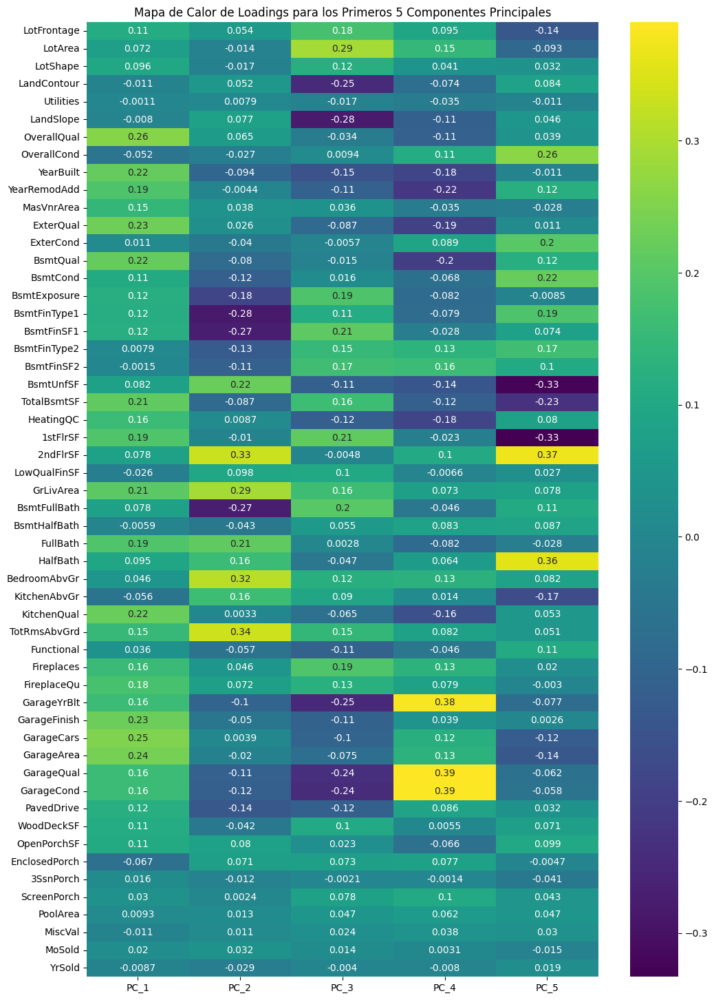

Variables con mayor peso en el Componente Principal 1 (PC1):
OverallQual     0.259335
GarageCars      0.249893
GarageArea      0.238287
ExterQual       0.231552
GarageFinish    0.227454
KitchenQual     0.223127
BsmtQual        0.219421
YearBuilt       0.218366
TotalBsmtSF     0.212340
GrLivArea       0.207404
Name: PC_1, dtype: float64


In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Asumimos que ya tienes tu objeto 'pca_final' ajustado y los nombres de las columnas en 'numeric_cols'

# 1. Crear un DataFrame con los loadings (pesos) de cada variable en cada componente
# pca_final.components_ nos da un array donde cada fila es un componente y cada columna es una variable.
# Lo transponemos (.T) para que las variables estén en las filas y los componentes en las columnas.
df_loadings = pd.DataFrame(
    pca_final.components_.T,
    columns=[f'PC_{i+1}' for i in range(N_COMPONENTS)], # N_COMPONENTS es el número que elegiste
    index=numeric_cols
)

# 2. Visualizar los loadings de los primeros componentes con un mapa de calor
# Nos enfocamos en los primeros 5-10 componentes, que son los que más información contienen.
plt.figure(figsize=(12, 18))
sns.heatmap(df_loadings[['PC_1', 'PC_2', 'PC_3', 'PC_4', 'PC_5']], annot=True, cmap='viridis')
plt.title('Mapa de Calor de Loadings para los Primeros 5 Componentes Principales')
plt.show()

# También podemos ver qué variables tienen más peso en el componente más importante (PC1)
print("Variables con mayor peso en el Componente Principal 1 (PC1):")
print(df_loadings['PC_1'].abs().sort_values(ascending=False).head(10))

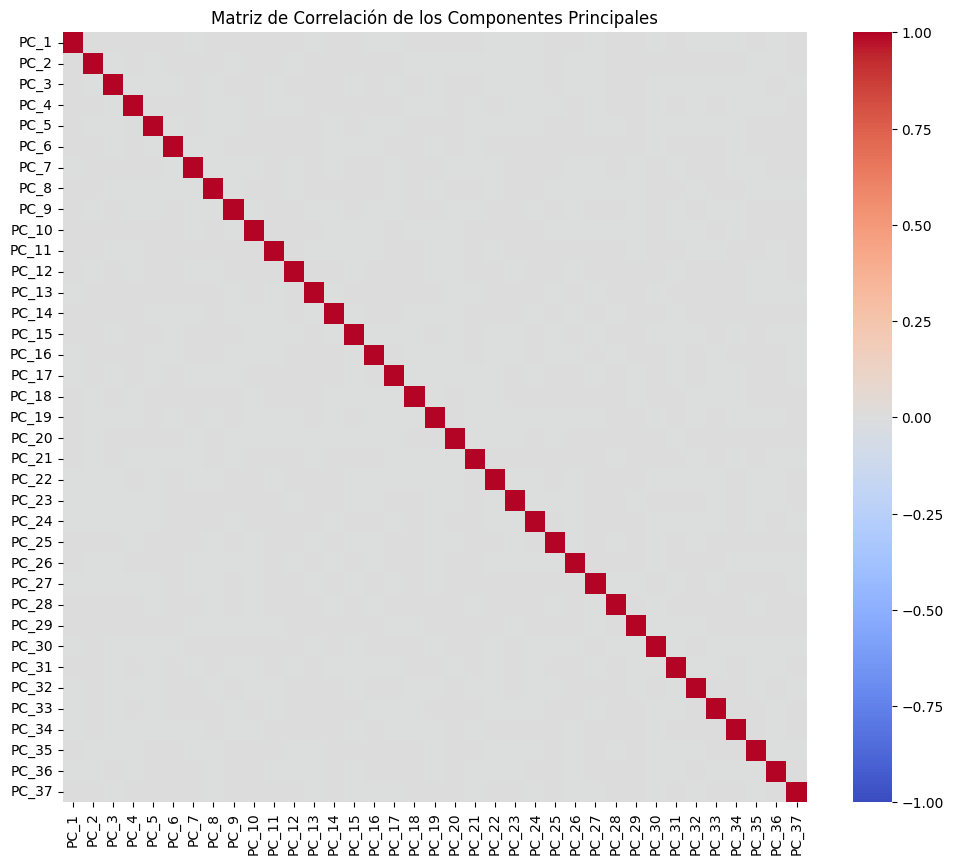

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Asumimos que ya tienes tu DataFrame 'df_pca' con los componentes

# 1. Calcular la matriz de correlación de los componentes principales
correlation_matrix_pca = df_pca.corr()

# 2. Visualizar la matriz con un mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_pca, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlación de los Componentes Principales')
plt.show()

In [42]:
df_final_for_model.shape

(1456, 60)

## Variables Categoricas

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:718: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


<Figure size 1800x1000 with 0 Axes>

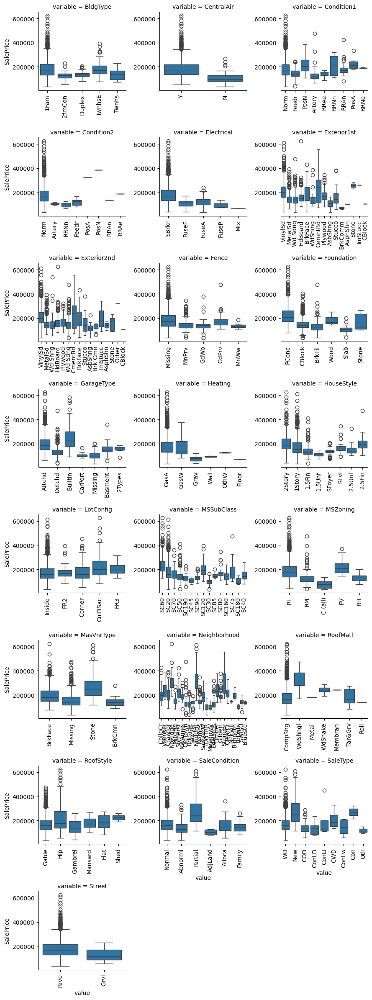

In [43]:
# Count plots of categorical features
plt.figure(figsize=(18,10))
f = pd.melt(df, id_vars=['SalePrice'], value_vars=sorted(col_vars))
g = sns.FacetGrid(f, col='variable', col_wrap=3, sharex=False, sharey=False)
g = g.map(sns.boxplot, 'value', 'SalePrice')
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat]
g.fig.tight_layout()
plt.show()


/tmp/ipython-input-4211014959.py:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Neighborhood", y="SalePrice", data=df, estimator=lambda x: x.mean(), ci=None)


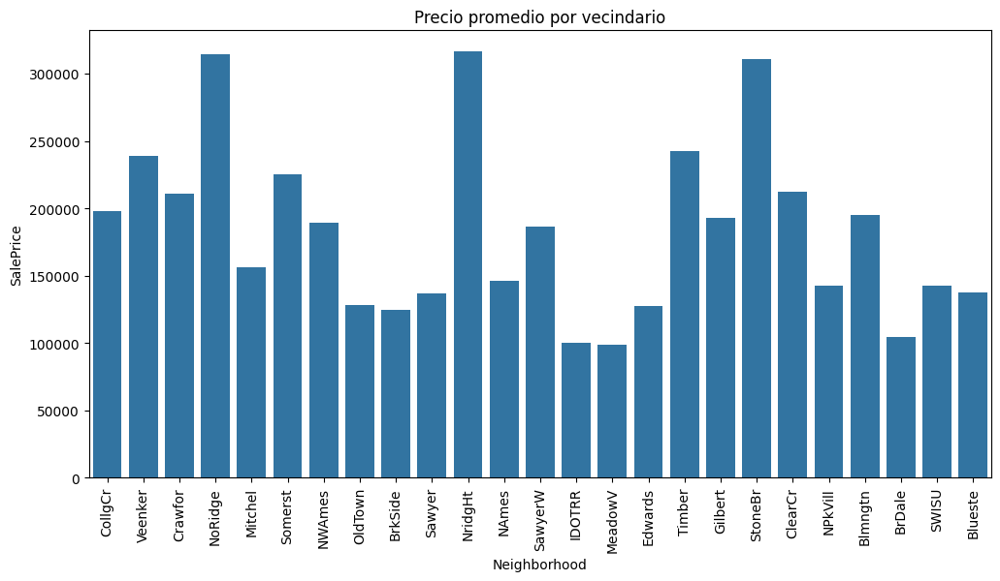

In [44]:
plt.figure(figsize=(12,6))
sns.barplot(x="Neighborhood", y="SalePrice", data=df, estimator=lambda x: x.mean(), ci=None)
plt.xticks(rotation=90)
plt.title("Precio promedio por vecindario")
plt.show()

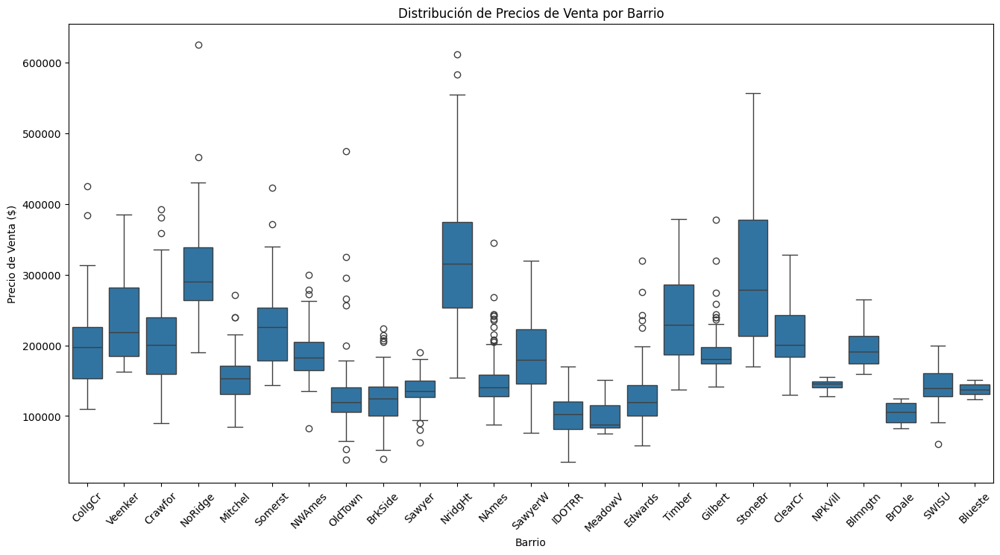

In [45]:
# Bloque 1: Boxplot de Neighborhood vs SalePrice
plt.figure(figsize=(16, 8))
sns.boxplot(data=df, x='Neighborhood', y='SalePrice')
plt.title('Distribución de Precios de Venta por Barrio')
plt.xlabel('Barrio')
plt.ylabel('Precio de Venta ($)')
plt.xticks(rotation=45)
plt.show()

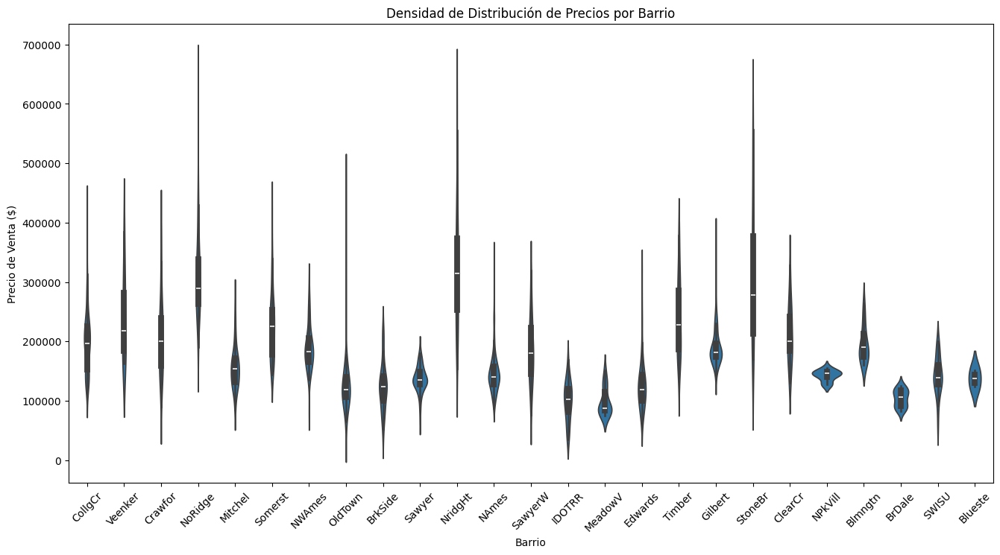

In [46]:
# Bloque 3: Violin plot de Neighborhood vs SalePrice
plt.figure(figsize=(16, 8))
sns.violinplot(data=df, x='Neighborhood', y='SalePrice')
plt.title('Densidad de Distribución de Precios por Barrio')
plt.xlabel('Barrio')
plt.ylabel('Precio de Venta ($)')
plt.xticks(rotation=45)
plt.show()

In [47]:
# Bloque 4: Prueba estadística para Neighborhood
from scipy.stats import kruskal

# Preparar los datos: lista de precios por barrio
grupos = [df[df['Neighborhood'] == barrio]['SalePrice'] for barrio in df['Neighborhood'].unique()]

# Realizar prueba de Kruskal-Wallis
stat, p_valor = kruskal(*grupos)

print(f"Estadístico de Kruskal-Wallis: {stat:.4f}")
print(f"P-valor: {p_valor:.4f}")

if p_valor < 0.05:
    print("Existen diferencias significativas entre los precios de los barrios.")
else:
    print("No existen diferencias significativas entre los precios de los barrios.")

Estadístico de Kruskal-Wallis: 866.0794
P-valor: 0.0000
Existen diferencias significativas entre los precios de los barrios.


Como podemos observar en los graficos de cajas , el precio tiende a variar en casi todas las categorias , presentando casos de posibles outliers en las distintas variables .

Si quisieramos analizar mas adetalle y observar que variables categoricas tienen mayor peso , podriamos abordar asia la implementancion de Anova .

---



ANOVA (Análisis de Varianza) es una técnica estadística que sirve para comparar los promedios de un número de grupos y ver si esos grupos son realmente diferentes entre sí.



En nuestro caso, se usa para analizar si una variable categórica (por ejemplo, el barrio, el tipo de techo, el material exterior) tiene relación con el precio de la vivienda.

Si ANOVA encuentra diferencias grandes entre grupos, significa que esa variable puede ser importante para predecir el precio.


---
Dato a tener en cuenta :

Categorías raras: si una categoría aparece muy pocas veces, puede distorsionar el análisis. Conviene agruparlas en “Otros”.

Balance de grupos: ANOVA funciona mejor si los grupos tienen cantidades similares de datos.

No dice todo: un valor bajo de p indica que la variable está relacionada con el precio, pero no asegura que sea la mejor para el modelo.




---


En nuestro caso , como vimos en un principio tenemos valores que sesgan a otros , eso lo vimos con los % de frecuencia de las variables categoricas . Donde por ejemplo SaleCondition con valor "Norml" era el que mas frecuentaba el dataset . Una practica util seria agrupar los valores pocos frecuentes en un categoria "Others" , pero correriamos el riesgo de que un valor poco frecuente tenga un fuerte impacto con el targget y como resultado el modelo no podria captar esa informacion . (Entonces aca volvemos a lo mismo , si buscamos detalle o robustez )

----


Como no tengo mucho conocimiento del dominio agruparlas por su nivel de frecuencia seria un error , hay modelos que pueden adaptarse mejor (XgBoost)

Tarea para casa  :_)

## La calidad general

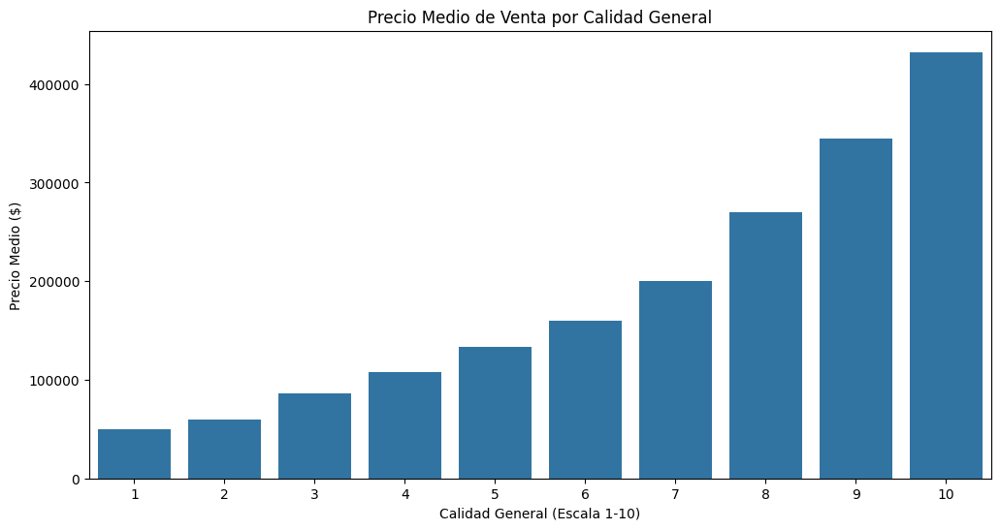

In [48]:
# Bloque 6: Gráfico de barras con precios medios por OverallQual
precio_medio_por_calidad = df.groupby('OverallQual')['SalePrice'].median()
plt.figure(figsize=(12, 6))
sns.barplot(x=precio_medio_por_calidad.index, y=precio_medio_por_calidad.values)
plt.title('Precio Medio de Venta por Calidad General')
plt.xlabel('Calidad General (Escala 1-10)')
plt.ylabel('Precio Medio ($)')
plt.show()

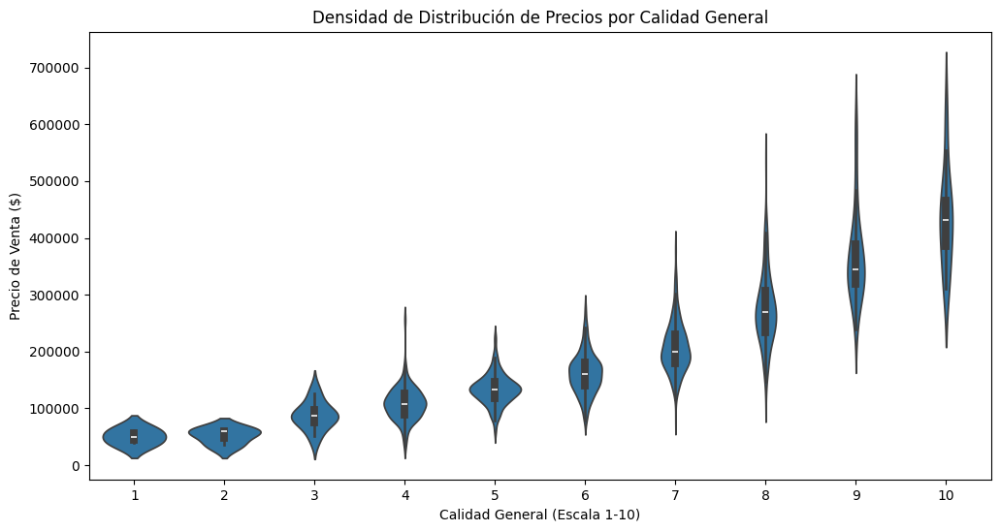

In [49]:
# Bloque 7: Violin plot de OverallQual vs SalePrice
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='OverallQual', y='SalePrice')
plt.title('Densidad de Distribución de Precios por Calidad General')
plt.xlabel('Calidad General (Escala 1-10)')
plt.ylabel('Precio de Venta ($)')
plt.show()

## Variables temporales ¿ Influyen en el precio ?

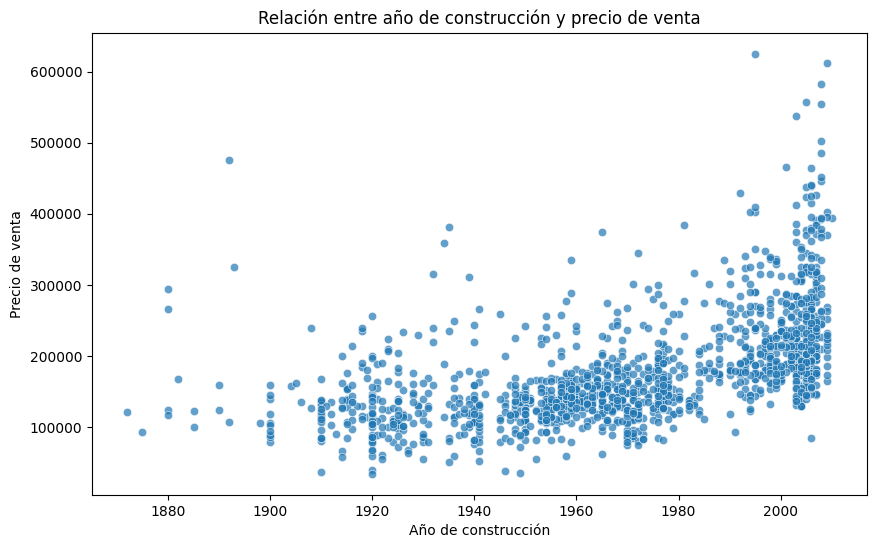

In [50]:
plt.figure(figsize=(10,6))
sns.scatterplot(x="YearBuilt", y="SalePrice", data=df, alpha=0.7)
plt.title("Relación entre año de construcción y precio de venta")
plt.xlabel("Año de construcción")
plt.ylabel("Precio de venta")
plt.show()

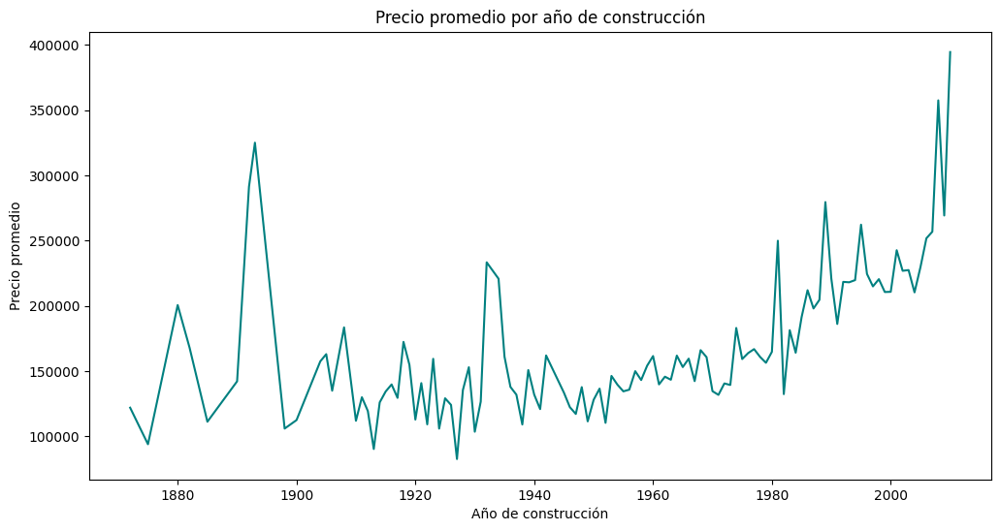

In [51]:
year_price = df.groupby("YearBuilt")["SalePrice"].mean().reset_index()

plt.figure(figsize=(12,6))
sns.lineplot(x="YearBuilt", y="SalePrice", data=year_price, color="teal")
plt.title("Precio promedio por año de construcción")
plt.xlabel("Año de construcción")
plt.ylabel("Precio promedio")
plt.show()


/tmp/ipython-input-3505026687.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


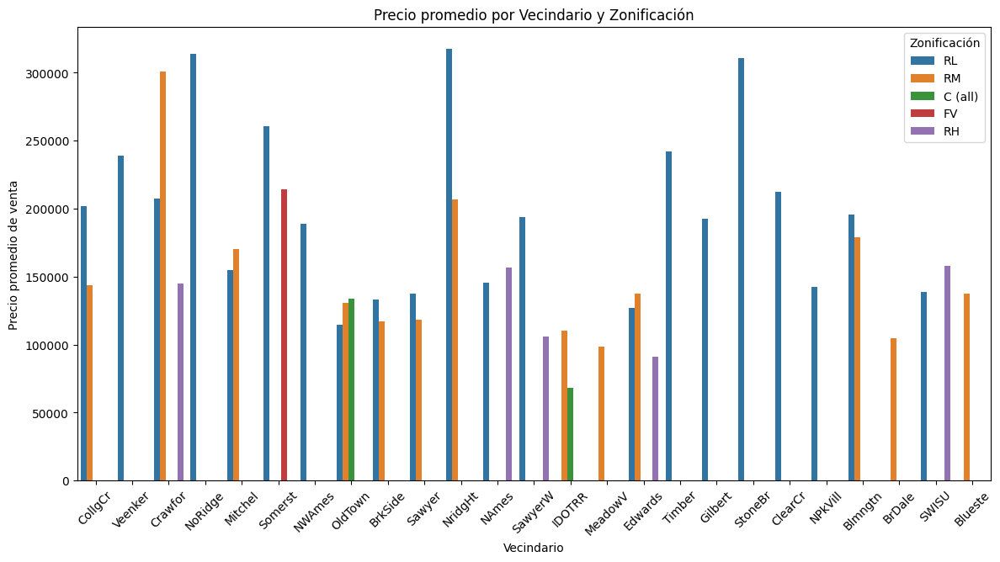

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,7))
sns.barplot(
    x="Neighborhood",
    y="SalePrice",
    hue="MSZoning",
    data=df,
    estimator=lambda x: x.mean(),
    ci=None
)
plt.xticks(rotation=45)
plt.title("Precio promedio por Vecindario y Zonificación")
plt.xlabel("Vecindario")
plt.ylabel("Precio promedio de venta")
plt.legend(title="Zonificación")
plt.show()


# Analizando otras variables

Ya decubri que tengo varias variables que estan correlacionadas con el precio de manera positiva . Ahora analizare otro grupo para ver si existe tambien algun tipo de correlacion y si son variables influyentes .

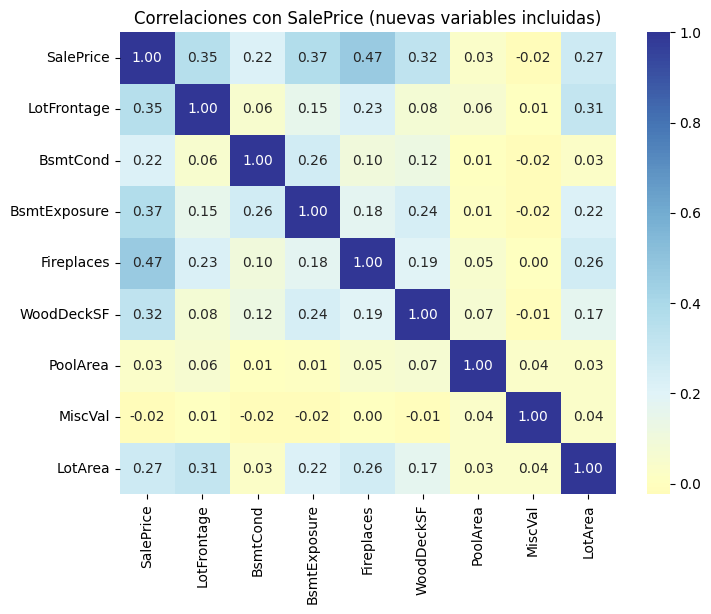

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

selected = ['SalePrice','LotFrontage','BsmtCond','BsmtExposure','Fireplaces','WoodDeckSF','PoolArea','MiscVal','LotArea']
corr = df[selected].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap='RdYlBu', fmt=".2f", center=0)
plt.title("Correlaciones con SalePrice (nuevas variables incluidas)")
plt.show()


En estas varaibles no se encuentra una correlacion positiva fuerte con la variable objetivo , la que mas se destaca es Fireplaces que seria el numero de chimeneas disponibles

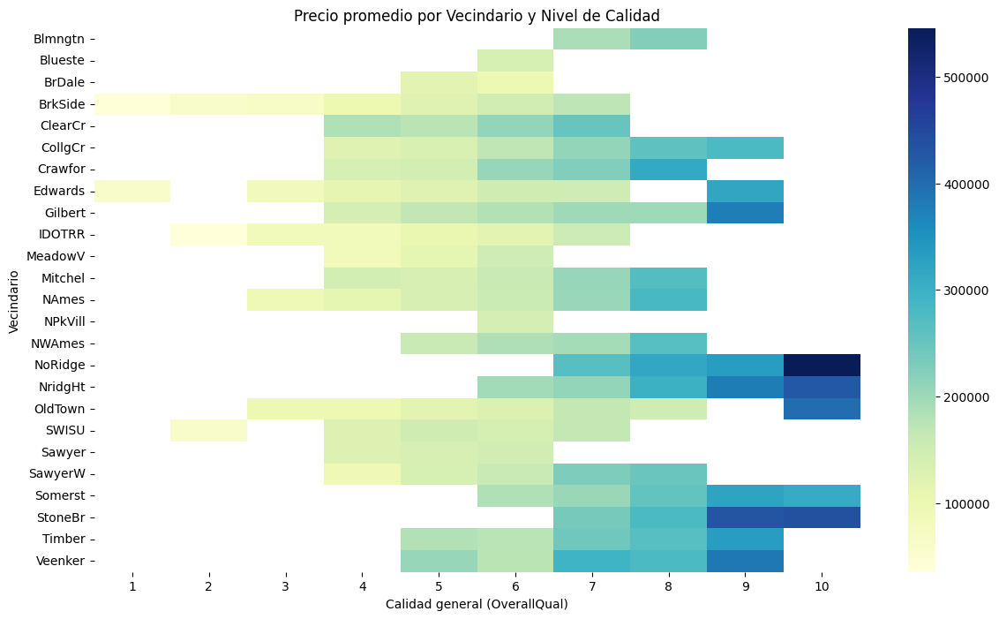

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Agrupamos por vecindario y calidad (puede ser OverallQual o OverallCond)
pivot = df.pivot_table(
    values='SalePrice',
    index='Neighborhood',
    columns='OverallQual',
    aggfunc='mean'
)

plt.figure(figsize=(14,8))
sns.heatmap(pivot, cmap='YlGnBu', annot=False)
plt.title("Precio promedio por Vecindario y Nivel de Calidad")
plt.xlabel("Calidad general (OverallQual)")
plt.ylabel("Vecindario")
plt.show()


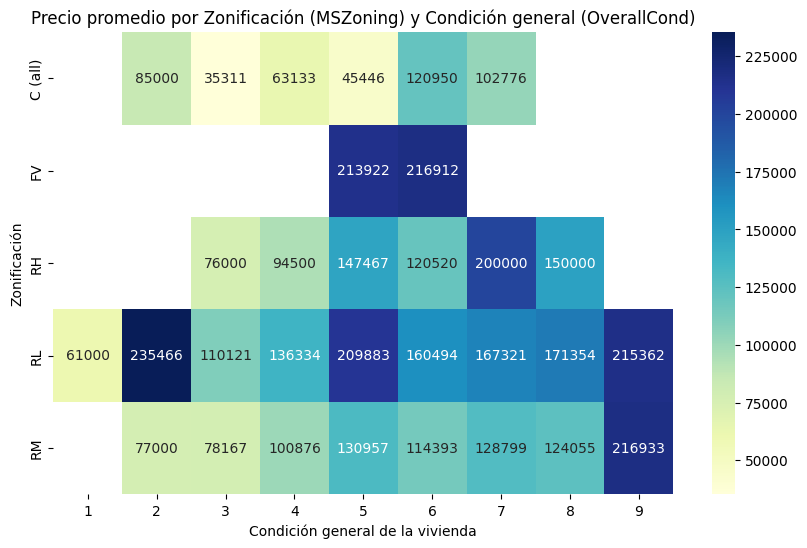

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Tabla dinámica con promedios
pivot = df.pivot_table(
    values='SalePrice',
    index='MSZoning',
    columns='OverallCond',
    aggfunc='mean'
)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, cmap='YlGnBu', annot=True, fmt=".0f")
plt.title("Precio promedio por Zonificación (MSZoning) y Condición general (OverallCond)")
plt.xlabel("Condición general de la vivienda")
plt.ylabel("Zonificación")
plt.show()



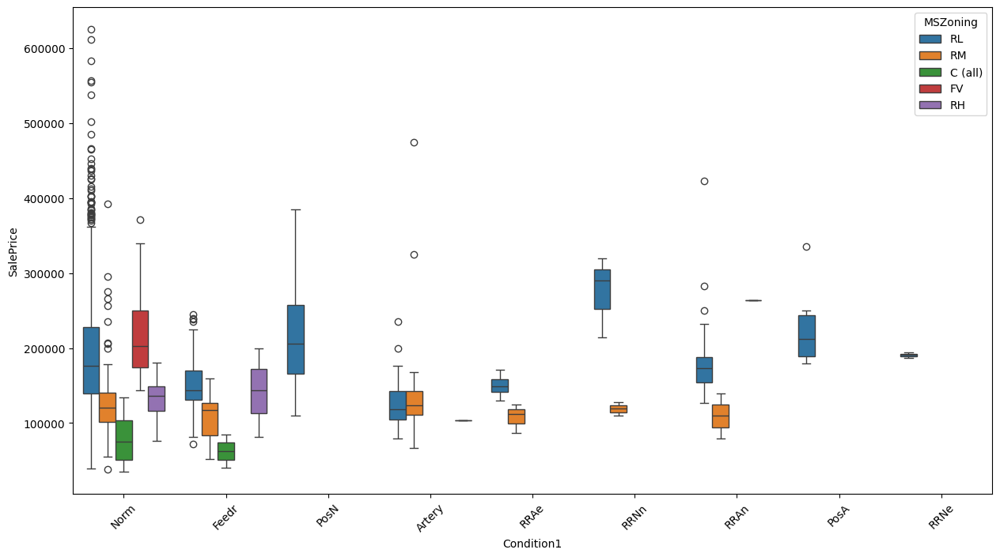

In [ ]:
plt.figure(figsize=(15, 8))
sns.boxplot(x='Condition1', y='SalePrice', hue='MSZoning', data=df)
plt.xticks(rotation=45)
plt.show()

/tmp/ipython-input-866063163.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




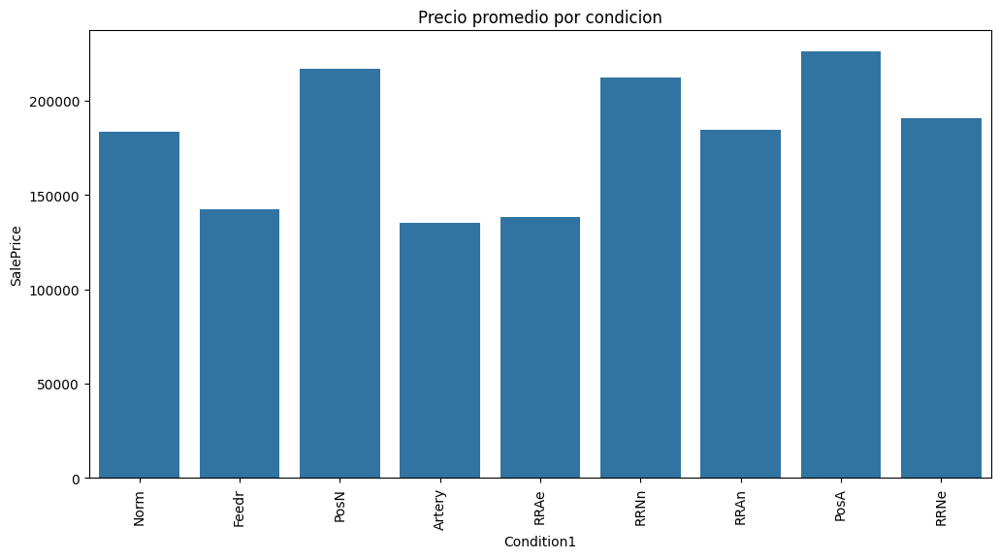

In [ ]:
plt.figure(figsize=(12,6))
sns.barplot(x="Condition1", y="SalePrice", data=df, estimator=lambda x: x.mean(), ci=None)
plt.xticks(rotation=90)
plt.title("Precio promedio por condicion")
plt.show()

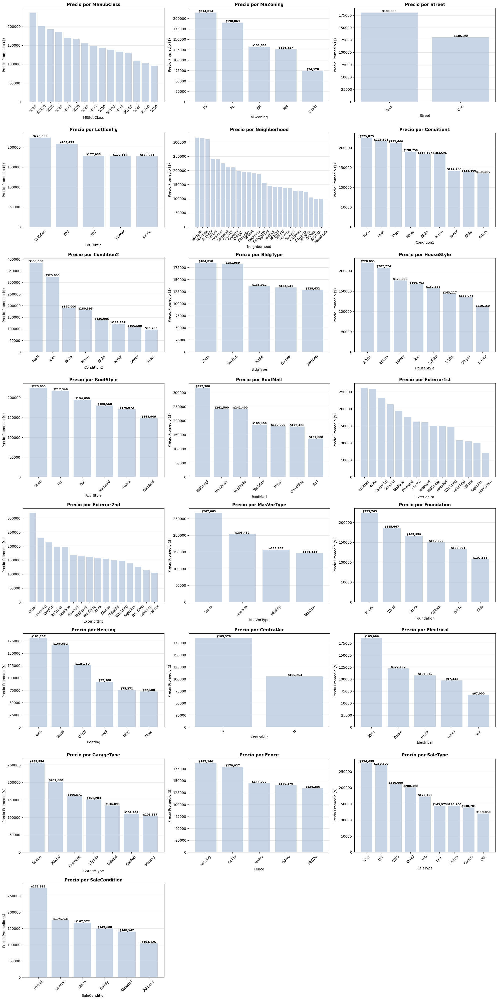

In [ ]:
# Calcular número de filas necesarias
n_cols = 3  # Columnas por fila
n_rows = (len(col_vars) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten() if n_rows > 1 else [axes]  # Aplanar array

for i, col in enumerate(col_vars):
    if i < len(axes):
        # Calcular precios promedios
        avg_prices = df.groupby(col)['SalePrice'].mean().sort_values(ascending=False)

        # Crear gráfico de barras
        bars = axes[i].bar(avg_prices.index, avg_prices.values, color='lightsteelblue', alpha=0.7)

        # Añadir valores en las barras (solo si no hay muchas categorías)
        if len(avg_prices) <= 10:
            for bar in bars:
                height = bar.get_height()
                axes[i].text(bar.get_x() + bar.get_width()/2., height,
                           f'${height:,.0f}',
                           ha='center', va='bottom', fontweight='bold', fontsize=8)

        axes[i].set_title(f'Precio por {col}', fontweight='bold')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Precio Promedio ($)')
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].grid(axis='y', alpha=0.3)

# Ocultar ejes vacíos si los hay
for j in range(len(col_vars), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

# Multivariado

Ya descurimos que una sola variable no habla del precio por si solo , sino que la interaccion entre las variables podria revelar patrones calve .

In [32]:
# Variables estructurales promedio por vecindario
neigh_features = (
    df.groupby('Neighborhood')[['GrLivArea', 'OverallQual', 'OverallCond', 'YearBuilt']]
      .mean()
      .reset_index()
)


In [33]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt
scaler = StandardScaler()
X_scaled = scaler.fit_transform(neigh_features[['GrLivArea', 'OverallQual', 'OverallCond', 'YearBuilt']])


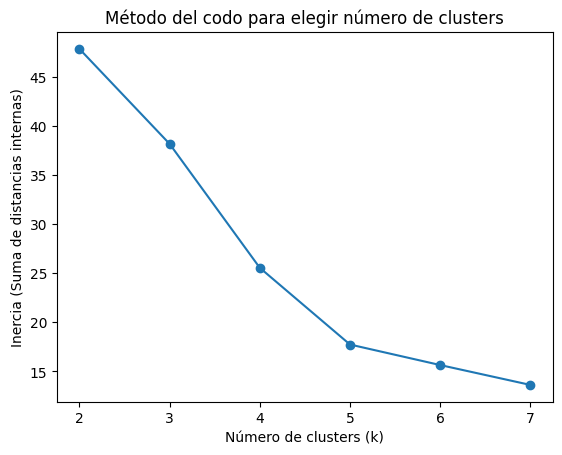

In [34]:
inertia = []
K = range(2, 8)
for k in K:
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(X_scaled)
    inertia.append(model.inertia_)

plt.plot(K, inertia, 'o-')
plt.title("Método del codo para elegir número de clusters")
plt.xlabel("Número de clusters (k)")
plt.ylabel("Inercia (Suma de distancias internas)")
plt.show()


In [35]:
kmeans = KMeans(n_clusters=4, random_state=42)
neigh_features['Cluster'] = kmeans.fit_predict(X_scaled)


In [36]:
df = df.merge(neigh_features[['Neighborhood','Cluster']], on='Neighborhood', how='left')


/tmp/ipython-input-3843815564.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Cluster', y='SalePrice', data=df, palette='Spectral')


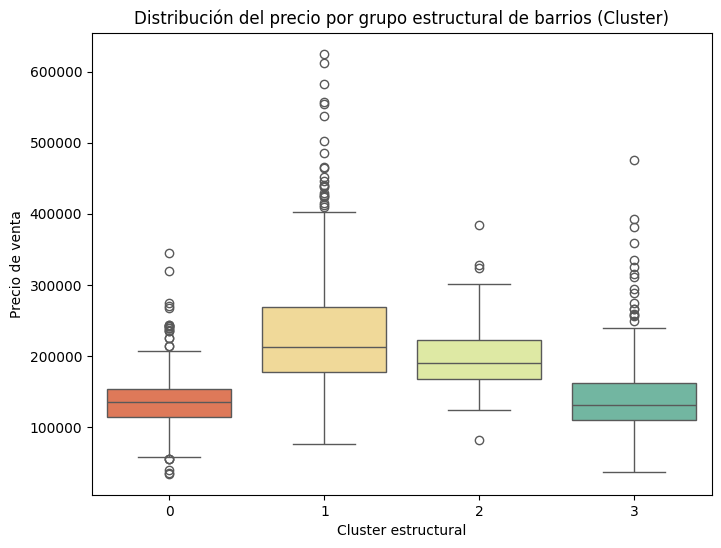

In [37]:
plt.figure(figsize=(8,6))
sns.boxplot(x='Cluster', y='SalePrice', data=df, palette='Spectral')
plt.title("Distribución del precio por grupo estructural de barrios (Cluster)")
plt.xlabel("Cluster estructural")
plt.ylabel("Precio de venta")
plt.show()


In [ ]:
cluster_summary = (
    neigh_features.groupby('Cluster')[['GrLivArea','OverallQual','OverallCond','YearBuilt']]
    .mean().round(1)
)
cluster_summary['SalePrice_median'] = df.groupby('Cluster')['SalePrice'].median().round(0)
cluster_summary


,GrLivArea,OverallQual,OverallCond,YearBuilt,SalePrice_median
Cluster,,,,,
0,1209.9,5.2,5.6,1963.6,135000.0
1,1744.2,7.3,5.1,1998.6,213245.0
2,1612.0,6.2,6.0,1976.1,190000.0
3,1568.9,5.5,6.3,1930.3,131000.0


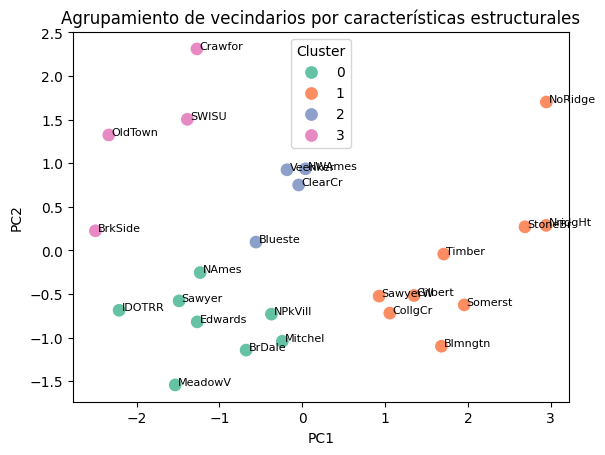

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_coords = pca.fit_transform(X_scaled)

neigh_features['PC1'] = pca_coords[:,0]
neigh_features['PC2'] = pca_coords[:,1]

sns.scatterplot(
    x='PC1', y='PC2', hue='Cluster',
    data=neigh_features, palette='Set2', s=100
)
for i, row in neigh_features.iterrows():
    plt.text(row['PC1']+0.03, row['PC2'], row['Neighborhood'], fontsize=8)
plt.title("Agrupamiento de vecindarios por características estructurales")
plt.show()


In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('SalePrice ~ C(Cluster)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)


                  sum_sq      df           F         PR(>F)
C(Cluster)  2.879938e+12     3.0  245.450431  8.128526e-129
Residual    5.678906e+12  1452.0         NaN            NaN


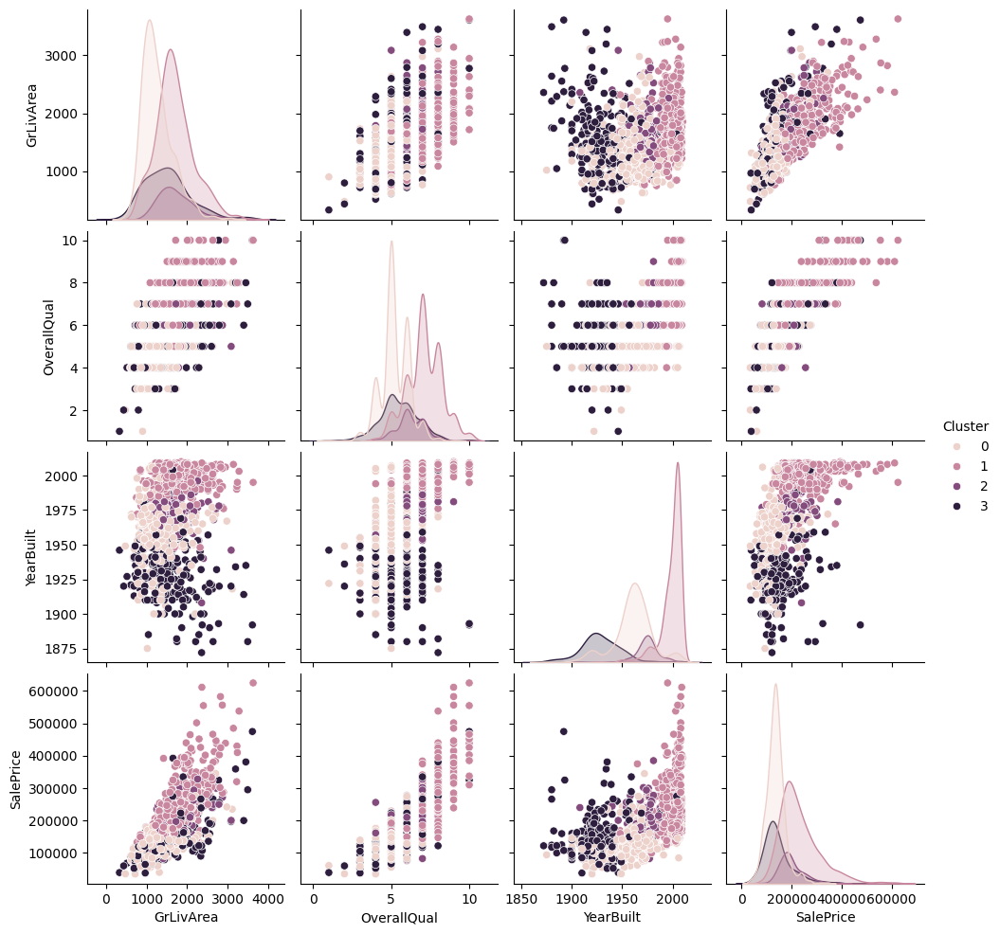

In [ ]:
sns.pairplot(df, vars=['GrLivArea','OverallQual','YearBuilt','SalePrice'], hue='Cluster')
plt.show()


Con el objetivo de identificar patrones estructurales entre los distintos vecindarios, se realizó un análisis de agrupamiento no supervisado (K-Means) utilizando variables que describen las características físicas y constructivas de las viviendas:

superficie habitable (GrLivArea),

calidad general (OverallQual),

condición general (OverallCond),

y año de construcción (YearBuilt).

Estas variables se seleccionaron por su relevancia directa en el valor de las propiedades, pero sin incluir el precio de venta (SalePrice) durante el proceso de agrupamiento, con el fin de evitar sesgos o fugas de información.

A través del método del codo, se determinó que el número óptimo de grupos era k = 4, balanceando simplicidad interpretativa y variabilidad interna.


---

Resultados

---
Los resultados del clustering mostraron cuatro grupos estructuralmente diferenciados:

Cluster 0: viviendas de menor tamaño, calidad baja y construidas alrededor de los años 60. Representan los barrios más antiguos y con precios medios más bajos.

Cluster 1: viviendas de gran superficie, alta calidad y construidas recientemente (décadas de 1990–2000). Corresponden a las zonas premium del conjunto de datos.

Cluster 2: propiedades de tamaño medio, calidad intermedia y antigüedad moderada, con precios de venta en el rango medio.

Cluster 3: viviendas pequeñas o medianas, de antigüedad elevada y calidad moderada, con precios bajos a medios.



---



A pesar de que el precio no se utilizó para formar los clusters, el análisis posterior reveló una clara ordenación del precio de venta dentro de los grupos, lo que confirma que las variables estructurales —superficie, calidad y antigüedad— explican gran parte de la variabilidad en el valor de las propiedades.




El gráfico de cajas (Boxplot) evidenció estas diferencias, mostrando cómo los precios medianos aumentan progresivamente desde los clusters más antiguos y de baja calidad hacia los más modernos y amplios.



el análisis de componentes principales (PCA) permitió visualizar cómo los vecindarios se agrupan naturalmente en el espacio de características, distinguiendo con claridad los barrios tradicionales de las zonas de expansión reciente.

Finalmente, el diagrama de dispersión múltiple (Pairplot) confirmó que los clusters se organizan de forma consistente en las relaciones Área–Precio, Calidad–Precio y Año–Precio, reforzando la coherencia interna de los grupos y la robustez del modelo de segmentación.

/tmp/ipython-input-3583382648.py:1: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.pointplot(


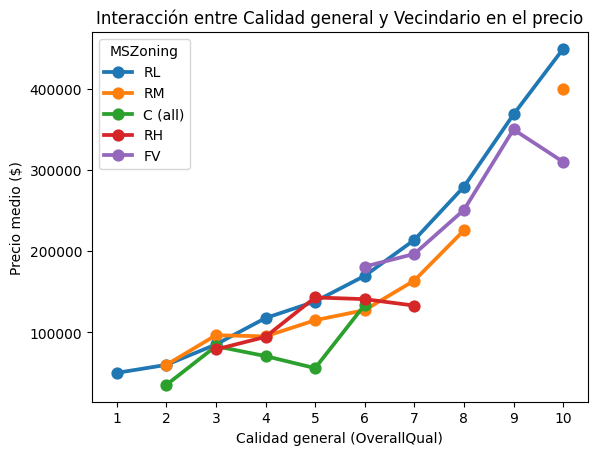

In [ ]:
sns.pointplot(
    data=df, x='OverallQual', y='SalePrice',
    hue='MSZoning', palette='tab10', ci=None
)
plt.title("Interacción entre Calidad general y Vecindario en el precio")
plt.xlabel("Calidad general (OverallQual)")
plt.ylabel("Precio medio ($)")
plt.show()


In [ ]:
from statsmodels.formula.api import ols
import statsmodels.api as sm

modelo_ancova = ols('SalePrice ~ C(Neighborhood) + GrLivArea', data=df).fit()
anova_tabla = sm.stats.anova_lm(modelo_ancova, typ=2)
print(anova_tabla)



                       sum_sq      df            F         PR(>F)
C(Neighborhood)  1.998651e+12    24.0    56.254418  8.994300e-187
GrLivArea        1.701448e+12     1.0  1149.342880  2.165834e-185
Residual         2.116923e+12  1430.0          NaN            NaN


Conclusión: Dado que el valor p es mucho menor que el nivel de significancia común (α=0.05), rechazamos la hipótesis nula.

 Existe una diferencia estadísticamente muy significativa en el precio de venta (SalePrice) promedio entre al menos algunos de los barrios, incluso después de tener en cuenta el área habitable (GrLivArea).


 El área habitable (GrLivArea) tiene un efecto estadísticamente muy significativo en el precio de venta (SalePrice), incluso después de tener en cuenta el efecto del barrio.

 tanto el barrio como el área habitable son predictores extremadamente significativos del precio de venta de las casas.

# Ingeniera de caracteristicas .

Llegado a este punto ya vimos que transformar algunas variables numercias era de gran utilidad para este conjunto de datos , si buscamos aplicar un modelo como RamdomForestRegresor. Pero ademas de eso podemos otras cosas - a lo que llamo Esteroides a los datos.


*  Aplicar tranformaciones log a las variables mencionadas
*  Crear Variables binarias
*  Crear nuevas variables deribadas ( si queremos saber que variable importo mas tenmos que tener cuidado con la colinelidad )
* Como no tenemos conocimiento del dominio por el momento no agrupare ningun valor dentro de las variables categoricas , solo las voy a convertir en dummies.



---



Crear nuevas variables deribadas podrian brindar informacion util al modelo , como por ejemplo edad de la casa  , Total_porch_sf , Total_espacio_libre , tiempo de la ultima remodelacion , M2_por_habitacion , Total_SF , TotalBatdrhooms . Lograr una puntuacion empoderada de las distintas puntuaciones ( Pero aca a tener en cuenta que una casa por ejemplo con 4 chimenas , y una calidad 2 podria ser igual que una casa con 2 chimeneas y una puntuacion de 4  las dos tendrian una puntuacion empoderada de 8 , pero seria engañoso )(¿ Calidad o cantidad ?) .




## Nuevas Variables

In [53]:
df["Total_M2_cub"] = (df["GrLivArea"] + df["TotalBsmtSF"]) #M2 cubiertos de la casa
#Edad de la casa al momento de la venta , Tiempo de la ultima remodelacion
df['Age'] = df['YrSold'] - df['YearBuilt']
df['SinceRemodel'] = df['YrSold'] - df['YearRemodAdd']


df['PorchSF'] = (df['WoodDeckSF'] + df['OpenPorchSF'] +
                 df['EnclosedPorch'] + df['3SsnPorch'] + df['ScreenPorch'])

df['TotalBathrooms'] = (df['FullBath'] + 0.5 * df['HalfBath'] +
                        df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath'])

df["M2_por_habitacion"] = df["Total_M2_cub"] / ( df["TotRmsAbvGrd"] +
                                              df["TotalBathrooms"] )

#Edad del Garage
df['GarageAge'] = df['YrSold'] - df['GarageYrBlt']

#Binarias
# Indicadores binarios tiene pileta ?
df['HasPool'] = (df['PoolArea'] > 0).astype(int)
df['HasMisc'] = (df['MiscVal'] > 0).astype(int)
df["HasBasement"] = (df["TotalBsmtSF"] > 0).astype(int)
df["HasMasonry"] = (df["MasVnrArea"] > 0).astype(int)

In [54]:
# M2UnfSF metros cuadrados sin cosntruir
df['M2UnfSF'] = df['LotArea'] - df['GrLivArea']


In [55]:
df["HasPorchs"] = ( df["PorchSF" ] > 0).astype(int)

Recordando lo analizado anteriormente , algunas de las variables se comportaban mejor tranformadas en escala logaritmica , y ahora se me viene a la duda , de si estas nuevas variables derivadas nesecitan pasar por el mismo proseso

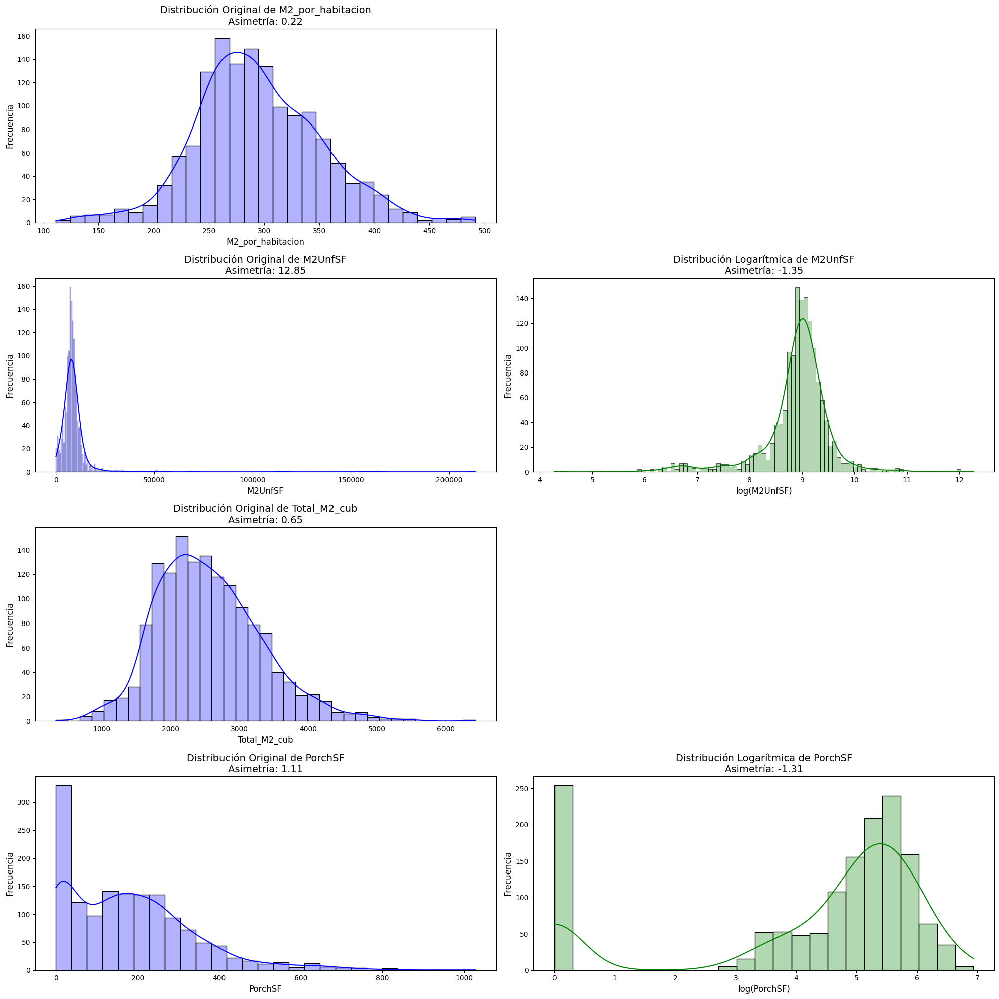

In [56]:
from scipy.stats import skew, mode

# Suponiendo que 'df' es tu DataFrame con las variables ya cargadas
Derivate_vars = ["M2_por_habitacion", "M2UnfSF", "Total_M2_cub", "PorchSF"]

# Umbral de asimetría para considerar un sesgo "fuerte"
skew_threshold = 0.75

# Variables que se van a graficar
vars_to_plot = []
for var in Derivate_vars:
    # Ignora los valores NaN para el cálculo de la asimetría
    if skew(df[var].dropna()) > skew_threshold:
        vars_to_plot.append((var, True))  # (variable, es_sesgada)
    else:
        vars_to_plot.append((var, False))

num_rows = len(vars_to_plot)
cols_per_row = 2
plt.figure(figsize=(10 * cols_per_row, 5 * num_rows))

for i, (col, is_skewed) in enumerate(vars_to_plot):
    # Gráfico de la variable original
    plt.subplot(num_rows, cols_per_row, 2 * i + 1)
    sns.histplot(data=df, x=col, kde=True, color='blue', alpha=0.3)
    plt.title(f'Distribución Original de {col}\nAsimetría: {skew(df[col].dropna()):.2f}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)

    if is_skewed:
        # Gráfico de la versión logarítmica
        plt.subplot(num_rows, cols_per_row, 2 * i + 2)
        # Aplica la transformación logarítmica
        log_col = np.log1p(df[col])
        sns.histplot(log_col.dropna(), kde=True, color='green', alpha=0.3)
        plt.title(f'Distribución Logarítmica de {col}\nAsimetría: {skew(log_col.dropna()):.2f}', fontsize=14)
        plt.xlabel(f'log({col})', fontsize=12)
        plt.ylabel('Frecuencia', fontsize=12)

plt.tight_layout()
plt.show()

Aplicar escala log a las variables recien creadas , tambien sera de utilidad... como podemos ver estas tienden a tener un asimetria mas parecida   a la normal

In [57]:
# aplicar las escala log a las variables alamcenadas dentro de derivate_vars
# y a las variables
vars_sesgadas = ["SalePrice", "GrLivArea", "LotFrontage", "LotArea"]

# Aplico log1p (log(1+x)) para evitar problemas con ceros
for col in Derivate_vars + vars_sesgadas:
    if col in df.columns:
        df[col] = np.log1p(df[col])



In [58]:
# Una ves traformadas las variables aplicar dummies para tranformar cada columna cateogrica en una variable numerica.
# Separar X e y
X = df.drop("SalePrice", axis=1)
y = df["SalePrice"]

# Crear dummies para categóricas
X = pd.get_dummies(X, drop_first=True)

# Peppline cros-validation + modelado

In [59]:
from sklearn.model_selection import train_test_split

# División del dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


In [60]:
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline



# --- FUNCIONES DE RMSE  ---

# RMSE en escala logarítmica (para comparar con la salida original)
def rmse_log(model, X, y_log):
    return np.sqrt(mean_squared_error(y_log, model.predict(X)))

# RMSE Real (en dólares)
def rmse_dolares(model, X, y_log_real):
    # Invertir la transformación a escala real (dólares)
    y_pred_real = np.expm1(model.predict(X))
    y_real = np.expm1(y_log_real)

    # Calcular el RMSE en la escala de dólares
    return np.sqrt(mean_squared_error(y_real, y_pred_real))

# --- PIPELINE DE ENTRENAMIENTO ---

# Paso 1: Búsqueda amplia
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso(max_iter=50000))
])

param_grid_wide = {
    'lasso__alpha': [0.0001, 0.001, 0.01, 0.1, 1., 5., 10., 25.]
}

grid = GridSearchCV(pipe, param_grid=param_grid_wide, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
alpha_wide = grid.best_params_['lasso__alpha']

# Paso 2: Búsqueda fina
param_grid_fine = {
    'lasso__alpha': [x / 100. * alpha_wide for x in range(50, 150, 5)]
}

grid = GridSearchCV(pipe, param_grid=param_grid_fine, cv=5, scoring='neg_mean_squared_error')
grid.fit(X_train, y_train)
alpha_final = grid.best_params_['lasso__alpha']
best_model = grid.best_estimator_

# --- EVALUACIÓN FINAL MODIFICADA ---

# Calcular métricas
train_rmse_log = rmse_log(best_model, X_train, y_train)
test_rmse_log = rmse_log(best_model, X_test, y_test)
test_rmse_real = rmse_dolares(best_model, X_test, y_test)


print('--- Resultados del Modelo Original (Sin PCA) ---')
print('Alpha óptimo: {:.5f}'.format(alpha_final))
print('Train RMSE (log scale): {:.5f} | Test RMSE (log scale): {:.5f}'.format(train_rmse_log, test_rmse_log))
print('TEST RMSE REAL (en dólares $): {:.2f}'.format(test_rmse_real))


--- Resultados del Modelo Original (Sin PCA) ---
Alpha óptimo: 0.00145
Train RMSE (log scale): 0.09386 | Test RMSE (log scale): 0.12119
TEST RMSE REAL (en dólares $): 18853.89


In [46]:
from sklearn.metrics import r2_score

r2_train = r2_score(y_train, best_model.predict(X_train))
r2_test = r2_score(y_test, best_model.predict(X_test))

print(f"Train R²: {r2_train:.4f} | Test R²: {r2_test:.4f}")


Train R²: 0.9436 | Test R²: 0.9070


In [47]:
def model_evaluation_plots(model, X_train, y_train, X_test, y_test):
    y_train_preds = model.predict(X_train)
    y_test_preds = model.predict(X_test)

    plt.figure(figsize=(12,6))
    # Residuals
    plt.subplot(121)
    plt.scatter(y_train_preds, y_train_preds - y_train, c='blue', marker='o', label='Training data')
    plt.scatter(y_test_preds, y_test_preds - y_test, c='orange', marker='s', label='Validation data')
    plt.title('Residuals')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.legend(loc='upper left')
    plt.hlines(y=0, xmin=y_train.min(), xmax=y_train.max(), color='red')

    # Predictions
    plt.subplot(122)
    plt.scatter(y_train_preds, y_train, c='blue', marker='o', label='Training data')
    plt.scatter(y_test_preds, y_test, c='orange', marker='s', label='Validation data')
    plt.title('Predictions')
    plt.xlabel('Predicted values')
    plt.ylabel('Real values')
    plt.legend(loc='upper left')
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], c='red')
    plt.tight_layout()
    plt.show()


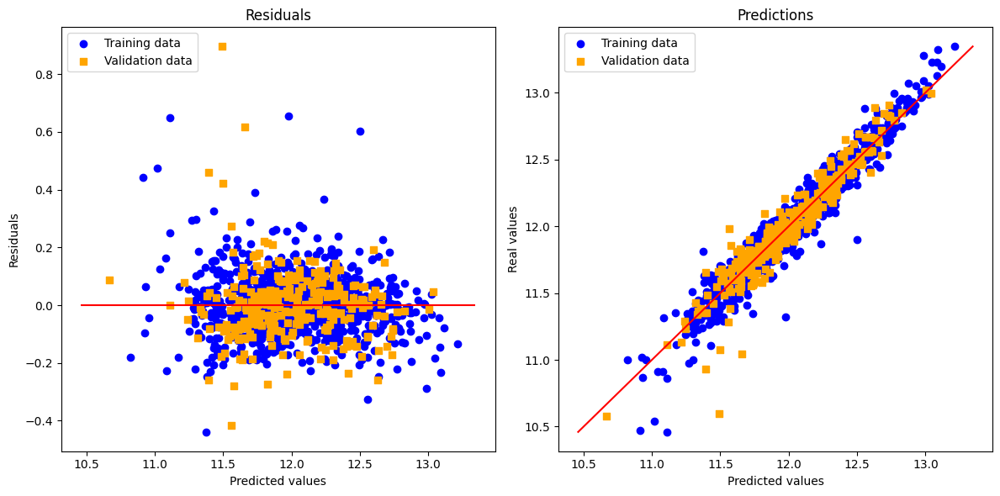

In [ ]:
model_evaluation_plots(best_model, X_train, y_train, X_test, y_test)

## Modelo con PCA

In [48]:
# 1.1 Separar X e y. El SalePrice está en df_final_for_model
X_pc_features = df_final_for_model.drop("SalePrice", axis=1).copy()
y_pc_original = df_final_for_model["SalePrice"].copy()


# np.log1p es log(1 + x), usado para estabilizar la varianza.
y_log_pc_completo = np.log1p(y_pc_original)

In [49]:
# Aplicar Dummies a las Variables Categóricas (X)

X_pc_completo_dummies = pd.get_dummies(X_pc_features, drop_first=True)

print("--- Resumen de Datos ---")
print(f"Número de features finales (PCs + Categóricas): {X_pc_completo_dummies.shape[1]}")
print(f"Total de observaciones: {X_pc_completo_dummies.shape[0]}\n")

--- Resumen de Datos ---
Número de features finales (PCs + Categóricas): 191
Total de observaciones: 1456



In [50]:
# Separación en Entrenamiento (Train) y Prueba (Test)
RANDOM_STATE_USADO = 42

X_pc_train, X_pc_test, y_log_train, y_log_test = train_test_split(
    X_pc_completo_dummies,
    y_log_pc_completo,
    test_size=0.2,
    random_state=RANDOM_STATE_USADO
)

print(f"Tamaño del set de entrenamiento: {X_pc_train.shape[0]}")
print(f"Tamaño del set de prueba: {X_pc_test.shape[0]}")

Tamaño del set de entrenamiento: 1164
Tamaño del set de prueba: 292


In [51]:
# Definición de Métricas
# RMSE para escala logarítmica (para comparar consistencia)
def rmse_log(model, X, y_log):
    return np.sqrt(mean_squared_error(y_log, model.predict(X)))

# RMSE para escala real (en dólares, para comparación final)
def rmse_real(model, X, y_log_real):
    # Invertir la predicción y el valor real a escala original
    y_pred_real = np.expm1(model.predict(X))
    y_real = np.expm1(y_log_real)
    return np.sqrt(mean_squared_error(y_real, y_pred_real))


# Hiperparámetros (GridSearchCV)
pipe_pc = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso(max_iter=50000))
])

# Búsqueda amplia
param_grid_pc_wide = {
    'lasso__alpha': [0.0001, 0.001, 0.01, 0.1, 1., 5., 10., 25.]
}
grid_pc = GridSearchCV(pipe_pc, param_grid=param_grid_pc_wide, cv=5, scoring='neg_mean_squared_error')
grid_pc.fit(X_pc_train, y_log_train)
alpha_pc = grid_pc.best_params_['lasso__alpha']

# Búsqueda fina
param_grid_pc_fine = {
    'lasso__alpha': [x / 100. * alpha_pc for x in range(50, 150, 5)]
}
grid_pc = GridSearchCV(pipe_pc, param_grid=param_grid_pc_fine, cv=5, scoring='neg_mean_squared_error')
grid_pc.fit(X_pc_train, y_log_train)
alpha_pc_final = grid_pc.best_params_['lasso__alpha']
best_model_pc = grid_pc.best_estimator_


In [52]:
# --- 4.3 Evaluación Final ---
print("\n--- Resultados del Modelo Lasso (PCA + log(y)) ---")
print('Alpha óptimo encontrado: {:.5f}'.format(alpha_pc_final))

# Métrica de consistencia (en escala logarítmica)
train_rmse_log = rmse_log(best_model_pc, X_pc_train, y_log_train)
test_rmse_log = rmse_log(best_model_pc, X_pc_test, y_log_test)
print('Train RMSE (log scale): {:.5f} | Test RMSE (log scale): {:.5f}'.format(train_rmse_log, test_rmse_log))

# Métrica de presentación (en escala de dólares)
test_rmse_real = rmse_real(best_model_pc, X_pc_test, y_log_test)
print('TEST RMSE REAL (en dólares $): {:.2f}'.format(test_rmse_real))



--- Resultados del Modelo Lasso (PCA + log(y)) ---
Alpha óptimo encontrado: 0.00145
Train RMSE (log scale): 0.10014 | Test RMSE (log scale): 0.13216
TEST RMSE REAL (en dólares $): 21375.32


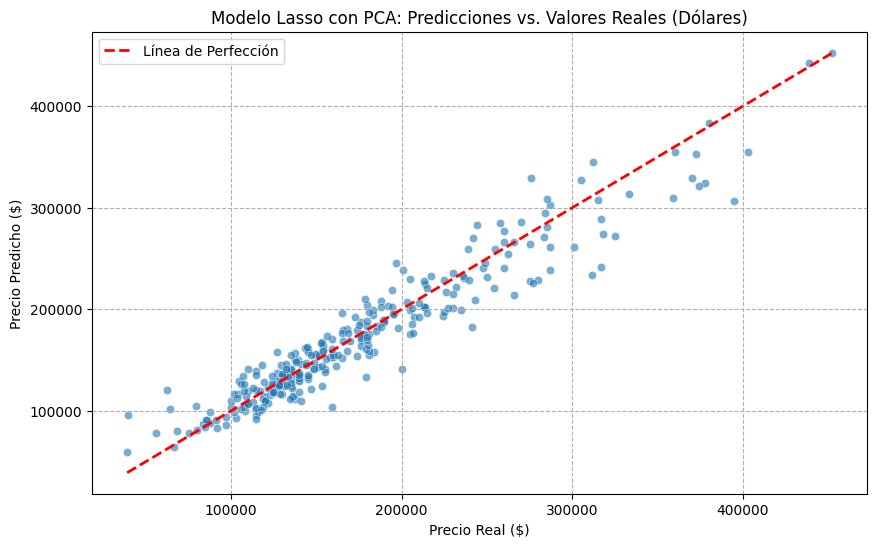

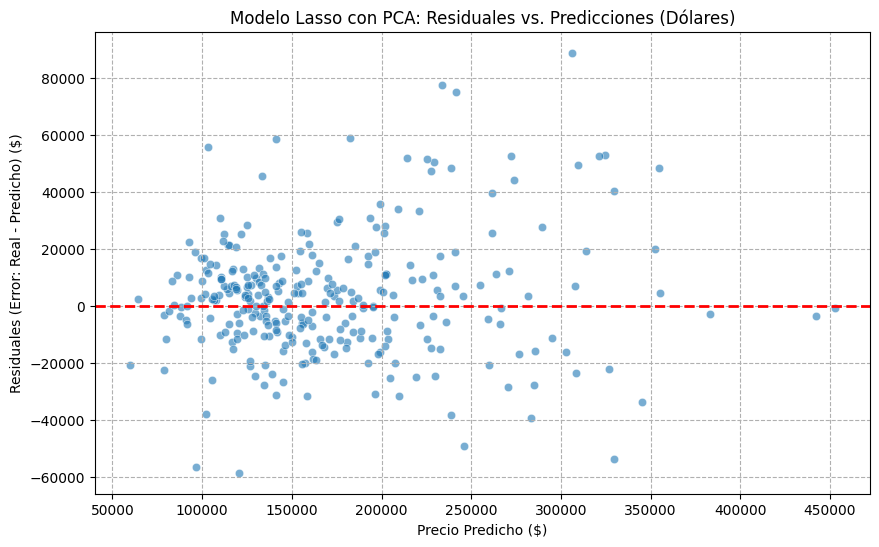

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#  Escala Real (Dólares)

# Predecir con el modelo PCA
y_log_pred_pc = best_model_pc.predict(X_pc_test)

# Revertir predicciones y valores reales a la escala de dólares
y_pred_real_pc = np.expm1(y_log_pred_pc)
y_test_real_pc = np.expm1(y_log_test)

# Calcular los residuales (Error = Valor Real - Predicción)
residuals_pc = y_test_real_pc - y_pred_real_pc


# Predicciones vs. Valores Reales (Actual vs. Predicted)
plt.figure(figsize=(10, 6))
# Gráfico de dispersión
sns.scatterplot(x=y_test_real_pc, y=y_pred_real_pc, alpha=0.6)

# Línea de la perfección (donde Predicción = Real)
plt.plot([y_test_real_pc.min(), y_test_real_pc.max()],
         [y_test_real_pc.min(), y_test_real_pc.max()],
         color='red', linestyle='--', linewidth=2, label='Línea de Perfección')

plt.title('Modelo Lasso con PCA: Predicciones vs. Valores Reales (Dólares)')
plt.xlabel('Precio Real ($)')
plt.ylabel('Precio Predicho ($)')
plt.grid(True, linestyle='--')
plt.legend()
plt.show()


# Gráfico  Análisis de Residuales (Error)
plt.figure(figsize=(10, 6))
# Gráfico de dispersión de los residuales vs. las predicciones
sns.scatterplot(x=y_pred_real_pc, y=residuals_pc, alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)

plt.title('Modelo Lasso con PCA: Residuales vs. Predicciones (Dólares)')
plt.xlabel('Precio Predicho ($)')
plt.ylabel('Residuales (Error: Real - Predicho) ($)')
plt.grid(True, linestyle='--')
plt.show()

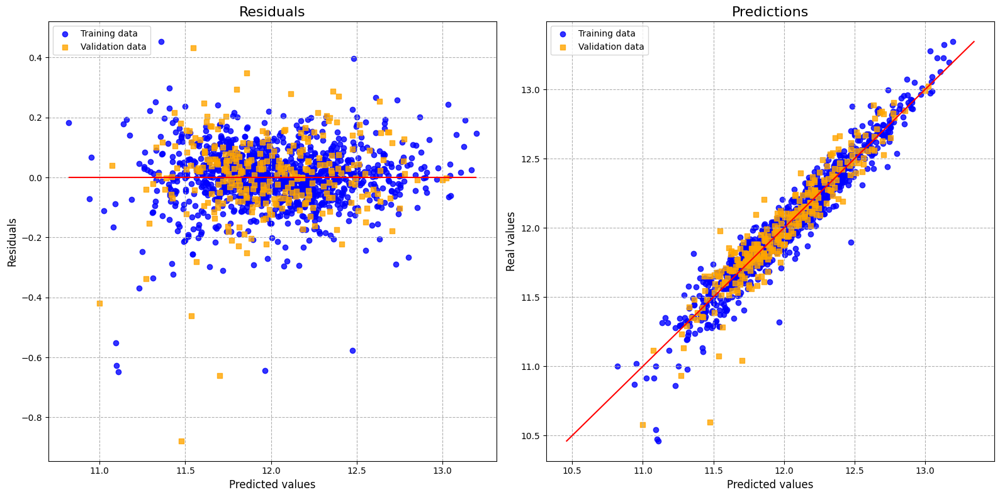

In [54]:
# Predicciones en el conjunto de entrenamiento
y_log_pred_train = best_model_pc.predict(X_pc_train)
# Predicciones en el conjunto de prueba (validation data)
y_log_pred_test = best_model_pc.predict(X_pc_test)

# Calcular Residuales
residuals_train = y_log_train - y_log_pred_train
residuals_test = y_log_test - y_log_pred_test



plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
# Training Data (Azul)
plt.scatter(y_log_pred_train, residuals_train, c='blue', marker='o', label='Training data', alpha=0.8)
# Validation/Test Data (Naranja)
plt.scatter(y_log_pred_test, residuals_test, c='orange', marker='s', label='Validation data', alpha=0.8)

plt.title('Residuals', fontsize=16)
plt.xlabel('Predicted values', fontsize=12)
plt.ylabel('Residuals', fontsize=12)
plt.legend(loc='upper left')
plt.hlines(y=0, xmin=y_log_pred_train.min(), xmax=y_log_pred_train.max(), color='red', linewidth=1.5)
plt.grid(True, linestyle='--')


# Actual vs. Predicted
plt.subplot(1, 2, 2)
plt.scatter(y_log_pred_train, y_log_train, c='blue', marker='o', label='Training data', alpha=0.8)
plt.scatter(y_log_pred_test, y_log_test, c='orange', marker='s', label='Validation data', alpha=0.8)
plt.plot([y_log_train.min(), y_log_train.max()],
         [y_log_train.min(), y_log_train.max()],
         color='red', linestyle='-', linewidth=1.5)

plt.title('Predictions', fontsize=16)
plt.xlabel('Predicted values', fontsize=12)
plt.ylabel('Real values', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, linestyle='--')

plt.tight_layout()
plt.show()

## Modelo Ridge

###  Sin PCA

In [55]:
from sklearn.linear_model import Ridge # Usamos Ridge en lugar de Lasso

# ENTRENAMIENTO RIDGE (DATOS ORIGINALES)

#Búsqueda amplia
pipe_ridge_orig = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge(max_iter=50000)) # <-- Modelo Ridge
])
# Rango de alpha para Ridge (similar a Lasso, pero ajustado)
param_grid_ridge_orig = {
    'ridge__alpha': [0.1, 1.0, 5.0, 10.0, 25.0, 50.0, 100.0]
}

grid_ridge_orig = GridSearchCV(pipe_ridge_orig, param_grid=param_grid_ridge_orig, cv=5, scoring='neg_mean_squared_error')
grid_ridge_orig.fit(X_train, y_train)
alpha_wide_ridge_orig = grid_ridge_orig.best_params_['ridge__alpha']

# Paso 2: Búsqueda fina
param_grid_ridge_orig_fine = {
    'ridge__alpha': [x / 100. * alpha_wide_ridge_orig for x in range(80, 120, 5)]
}

grid_ridge_orig = GridSearchCV(pipe_ridge_orig, param_grid=param_grid_ridge_orig_fine, cv=5, scoring='neg_mean_squared_error')
grid_ridge_orig.fit(X_train, y_train)
alpha_final_ridge_orig = grid_ridge_orig.best_params_['ridge__alpha']
best_model_ridge_orig = grid_ridge_orig.best_estimator_

# EVALUACIÓN FINAL

train_rmse_log_orig = rmse_log(best_model_ridge_orig, X_train, y_train)
test_rmse_log_orig = rmse_log(best_model_ridge_orig, X_test, y_test)
test_rmse_real_orig = rmse_dolares(best_model_ridge_orig, X_test, y_test)

print('--- Resultados del Modelo Ridge (Sin PCA) ---')
print('Alpha óptimo: {:.5f}'.format(alpha_final_ridge_orig))
print('Train RMSE (log scale): {:.5f} | Test RMSE (log scale): {:.5f}'.format(train_rmse_log_orig, test_rmse_log_orig))
print('TEST RMSE REAL (en dólares $): {:.2f}'.format(test_rmse_real_orig))

--- Resultados del Modelo Ridge (Sin PCA) ---
Alpha óptimo: 115.00000
Train RMSE (log scale): 0.09233 | Test RMSE (log scale): 0.12416
TEST RMSE REAL (en dólares $): 19844.28


### CON  PCA

In [56]:

# --- PIPELINE DE ENTRENAMIENTO RIDGE (DATOS PCA) ---

# Paso 1: Búsqueda amplia
pipe_ridge_pc = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge(max_iter=50000)) # <-- Modelo Ridge
])

param_grid_ridge_pc = {
    'ridge__alpha': [0.1, 1.0, 5.0, 10.0, 25.0, 50.0, 100.0]
}

grid_ridge_pc = GridSearchCV(pipe_ridge_pc, param_grid=param_grid_ridge_pc, cv=5, scoring='neg_mean_squared_error')
grid_ridge_pc.fit(X_pc_train, y_log_train)
alpha_wide_ridge_pc = grid_ridge_pc.best_params_['ridge__alpha']

# Paso 2: Búsqueda fina
param_grid_ridge_pc_fine = {
    'ridge__alpha': [x / 100. * alpha_wide_ridge_pc for x in range(80, 120, 5)]
}

grid_ridge_pc = GridSearchCV(pipe_ridge_pc, param_grid=param_grid_ridge_pc_fine, cv=5, scoring='neg_mean_squared_error')
grid_ridge_pc.fit(X_pc_train, y_log_train)
alpha_final_ridge_pc = grid_ridge_pc.best_params_['ridge__alpha']
best_model_ridge_pc = grid_ridge_pc.best_estimator_

# --- EVALUACIÓN FINAL ---

train_rmse_log_pc = rmse_log(best_model_ridge_pc, X_pc_train, y_log_train)
test_rmse_log_pc = rmse_log(best_model_ridge_pc, X_pc_test, y_log_test)
test_rmse_real_pc = rmse_dolares(best_model_ridge_pc, X_pc_test, y_log_test)

print('--- Resultados del Modelo Ridge (Con PCA) ---')
print('Alpha óptimo: {:.5f}'.format(alpha_final_ridge_pc))
print('Train RMSE (log scale): {:.5f} | Test RMSE (log scale): {:.5f}'.format(train_rmse_log_pc, test_rmse_log_pc))
print('TEST RMSE REAL (en dólares $): {:.2f}'.format(test_rmse_real_pc))

--- Resultados del Modelo Ridge (Con PCA) ---
Alpha óptimo: 28.75000
Train RMSE (log scale): 0.09683 | Test RMSE (log scale): 0.13844
TEST RMSE REAL (en dólares $): 22798.73


## Comparacion de modelos Iniciales


/tmp/ipython-input-1155981138.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Abs_Importance', y='Feature', data=df, ax=axes[i], palette='viridis')
/tmp/ipython-input-1155981138.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Abs_Importance', y='Feature', data=df, ax=axes[i], palette='viridis')
/tmp/ipython-input-1155981138.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Abs_Importance', y='Feature', data=df, ax=axes[i], palette='viridis')
/tmp/ipython-input-1155981138.py:42: FutureWarning: 

Passing `palette` without

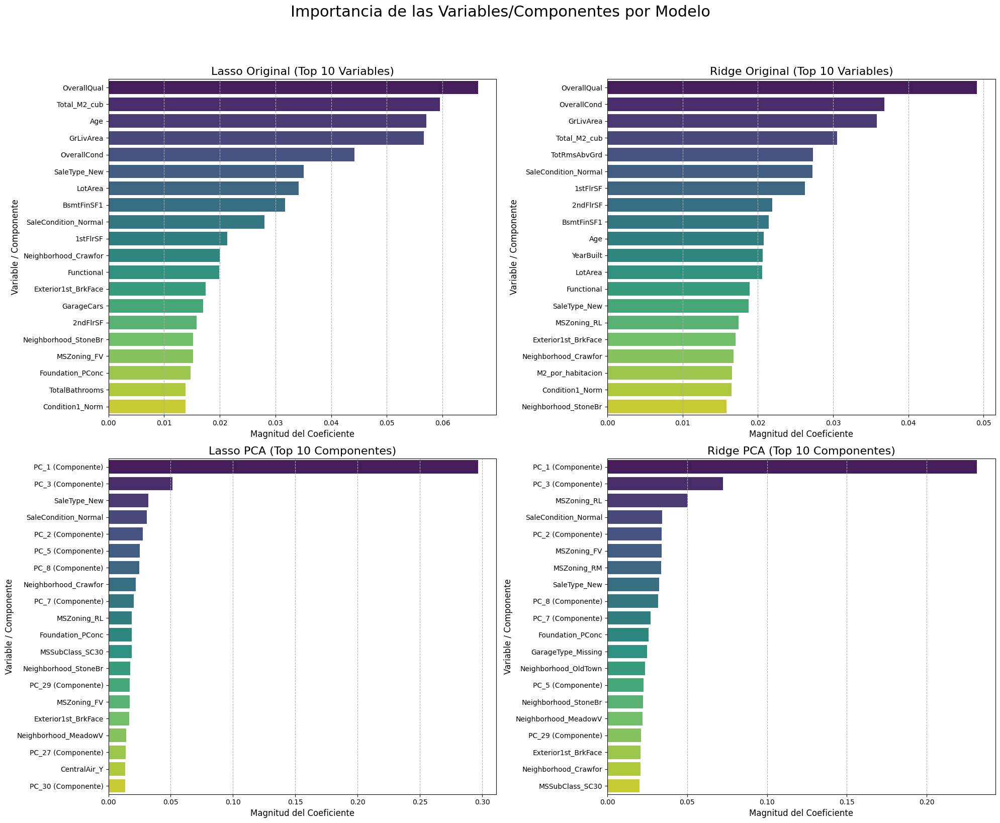

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# --- FUNCIÓN PARA EXTRAER COEFICIENTES ---
def get_coefficients_df(model, X_train_data, title):
    # Extrae el modelo final (Lasso o Ridge) de la Pipeline
    final_model = model.steps[-1][1]
    coef = final_model.coef_

    df = pd.DataFrame({
        'Feature': X_train_data.columns,
        'Importance': coef
    })
    df['Abs_Importance'] = df['Importance'].abs()
    df = df.sort_values(by='Abs_Importance', ascending=False).head(20)

    # Etiqueta especial para los PC
    df['Feature'] = df['Feature'].apply(lambda x: x if not x.startswith('PC_') else f'{x} (Componente)')
    return df

# 1. Crear los DataFrames de coeficientes para cada modelo
lasso_orig_df = get_coefficients_df(best_model, X_train, 'Lasso Original')
ridge_orig_df = get_coefficients_df(best_model_ridge_orig, X_train, 'Ridge Original')
lasso_pc_df = get_coefficients_df(best_model_pc, X_pc_train, 'Lasso PCA')
ridge_pc_df = get_coefficients_df(best_model_ridge_pc, X_pc_train, 'Ridge PCA')

# 2. Generar la Figura Única con 4 Subgráficos
fig, axes = plt.subplots(2, 2, figsize=(20, 16)) # 2 filas, 2 columnas de subgráficos
axes = axes.flatten() # Esto facilita la iteración sobre los subgráficos

# Lista de DataFrames y títulos para iterar
models_data = [
    (lasso_orig_df, 'Lasso Original (Top 10 Variables)'),
    (ridge_orig_df, 'Ridge Original (Top 10 Variables)'),
    (lasso_pc_df, 'Lasso PCA (Top 10 Componentes)'),
    (ridge_pc_df, 'Ridge PCA (Top 10 Componentes)')
]

for i, (df, title) in enumerate(models_data):
    sns.barplot(x='Abs_Importance', y='Feature', data=df, ax=axes[i], palette='viridis')
    axes[i].set_title(title, fontsize=16)
    axes[i].set_xlabel('Magnitud del Coeficiente', fontsize=12)
    axes[i].set_ylabel('Variable / Componente', fontsize=12)
    axes[i].grid(axis='x', linestyle='--')

plt.suptitle('Importancia de las Variables/Componentes por Modelo', fontsize=22, y=1.02) # Título general
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Ajustar diseño para dejar espacio al título general
plt.show()

In [58]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from IPython.display import display # Importar display para mostrar la tabla en un notebook

# --- 1. FUNCIÓN DE EVALUACIÓN COMPLETA ---

def evaluate_model(model, X_test_data, y_log_test_data, model_name, data_approach):
    """Calcula RMSE (log y real) y R^2 (log) para un modelo específico."""

    # Predicción en escala logarítmica
    y_log_pred = model.predict(X_test_data)

    # Revertir a escala de dólares para el RMSE Real
    y_pred_real = np.expm1(y_log_pred)
    y_test_real = np.expm1(y_log_test_data)

    # Calcular Métricas
    rmse_log = np.sqrt(mean_squared_error(y_log_test_data, y_log_pred))
    rmse_real = np.sqrt(mean_squared_error(y_test_real, y_pred_real))
    r2_log = r2_score(y_log_test_data, y_log_pred)

    return {
        'Modelo': model_name,
        'Enfoque de Datos': data_approach,
        'R² (Log Scale)': r2_log,
        'RMSE (Log Scale)': rmse_log,
        'RMSE REAL (Error Promedio en $)': rmse_real
    }

# --- 2. EVALUACIÓN Y CONSOLIDACIÓN DE RESULTADOS ---

# NOTA: Asumimos que todas las variables necesarias están definidas.

results_data = [
    evaluate_model(best_model, X_test, y_test, 'Lasso', 'Original (Sin PCA)'),
    evaluate_model(best_model_ridge_orig, X_test, y_test, 'Ridge', 'Original (Sin PCA)'),
    evaluate_model(best_model_pc, X_pc_test, y_log_test, 'Lasso', 'PCA (Componentes)'),
    evaluate_model(best_model_ridge_pc, X_pc_test, y_log_test, 'Ridge', 'PCA (Componentes)')
]

# Consolidar todos los resultados en un DataFrame
results_df = pd.DataFrame(results_data)

# --- 3. PRESENTACIÓN Y FORMATO DE LA TABLA FINAL ---

# Reordenar columnas y ordenar por el error real (ascendente: el menor error es el mejor)
results_df = results_df[[
    'Modelo',
    'Enfoque de Datos',
    'RMSE REAL (Error Promedio en $)',
    'R² (Log Scale)',
    'RMSE (Log Scale)'
]].sort_values(by='RMSE REAL (Error Promedio en $)', ascending=True)


# Aplicar formato numérico
formatted_table = results_df.style.format({
    'RMSE REAL (Error Promedio en $)': '${:,.2f}',
    'R² (Log Scale)': '{:.4f}',
    'RMSE (Log Scale)': '{:.4f}'
}).set_caption("Resumen Final de Rendimiento del Modelo de Regresión")


print("--- TABLA COMPARATIVA FINAL DE RENDIMIENTO ---\n")
# Mostrar la tabla formateada sin estilo de color
display(formatted_table)

--- TABLA COMPARATIVA FINAL DE RENDIMIENTO ---



,Modelo,Enfoque de Datos,RMSE REAL (Error Promedio en $),R² (Log Scale),RMSE (Log Scale)
0,Lasso,Original (Sin PCA),"$18,852.71",0.9070,0.1212
1,Ridge,Original (Sin PCA),"$19,844.28",0.9024,0.1242
2,Lasso,PCA (Componentes),"$21,375.32",0.8894,0.1322
3,Ridge,PCA (Componentes),"$22,798.73",0.8786,0.1384


## Nuevos modelos

### RamdomForest

In [88]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor

rf_pipe = Pipeline([
    ('scaler', StandardScaler()),   # opcional, pero OK mantenerlo para consistencia
    ('rf', RandomForestRegressor(
        n_estimators=500,
        max_depth=None,
        random_state=42,
        n_jobs=-1
    ))
])

rf_pipe.fit(X_train, y_train)

rf_pred_log = rf_pipe.predict(X_test)
rf_pred_real = np.expm1(rf_pred_log)

rf_rmse = np.sqrt(mean_squared_error(np.expm1(y_test), rf_pred_real))
print("Random Forest RMSE ($):", rf_rmse)


Random Forest RMSE ($): 23875.3048373168


### XGB

In [89]:
from xgboost import XGBRegressor

xgb_pipe = Pipeline([
    ('scaler', StandardScaler()),    # XGB no lo necesita, pero no afecta
    ('xgb', XGBRegressor(
        n_estimators=600,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.9,
        colsample_bytree=0.9,
        objective="reg:squarederror",
        n_jobs=-1,
        random_state=42
    ))
])

xgb_pipe.fit(X_train, y_train)

xgb_pred_log = xgb_pipe.predict(X_test)
xgb_pred_real = np.expm1(xgb_pred_log)

xgb_rmse = np.sqrt(mean_squared_error(np.expm1(y_test), xgb_pred_real))
print("XGBoost RMSE ($):", xgb_rmse)


XGBoost RMSE ($): 22573.82877975673


### Huber

In [81]:
from sklearn.linear_model import HuberRegressor

huber_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('huber', HuberRegressor(max_iter=50000, epsilon=1.35))
])

huber_pipe.fit(X_train, y_train)

huber_pred_log = huber_pipe.predict(X_test)
huber_pred_real = np.expm1(huber_pred_log)

huber_rmse = np.sqrt(mean_squared_error(np.expm1(y_test), huber_pred_real))
print("Huber RMSE ($):", huber_rmse)


Huber RMSE ($): 19524.411613284257


### Comparacion Modelos

In [74]:
results = pd.DataFrame({
    "Modelo": ["Lasso", "Random Forest", "XGBoost", "Huber"],
    "RMSE ($)": [
        test_rmse_real,
        rf_rmse,
        xgb_rmse,
        huber_rmse
    ]
})

results


,Modelo,RMSE ($)
0,Lasso,18852.709171
1,Random Forest,23875.304837
2,XGBoost,22573.828780
3,Huber,19524.411613


## Modelos Optimizados


In [75]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

rf_pipe = Pipeline([
    ('scaler', StandardScaler()),   # podés dejarlo o quitarlo, RF no lo necesita
    ('rf', RandomForestRegressor(random_state=42))
])

param_dist_rf = {
    "rf__n_estimators": randint(300, 1200),
    "rf__max_depth": randint(5, 40),
    "rf__min_samples_split": randint(2, 15),
    "rf__min_samples_leaf": randint(1, 10),
    "rf__max_features": ["sqrt", "log2", None]
}

rf_search = RandomizedSearchCV(
    rf_pipe,
    param_distributions=param_dist_rf,
    n_iter=40,                # 40 iteraciones es profesional
    cv=5,
    n_jobs=-1,
    scoring="neg_mean_squared_error",
    random_state=42
)

rf_search.fit(X_train, y_train)

rf_best = rf_search.best_estimator_
rf_best_pred = np.expm1(rf_best.predict(X_test))
rf_best_rmse = np.sqrt(mean_squared_error(np.expm1(y_test), rf_best_pred))

print("RF Best Params:", rf_search.best_params_)
print("RF Optimizado RMSE ($):", rf_best_rmse)


RF Best Params: {'rf__max_depth': 21, 'rf__max_features': None, 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 3, 'rf__n_estimators': 941}
RF Optimizado RMSE ($): 23895.62182798027


In [76]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV

xgb_pipe = Pipeline([
    ('scaler', StandardScaler()),   # opcional
    ('xgb', XGBRegressor(
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1
    ))
])

param_dist_xgb = {
    "xgb__n_estimators": randint(300, 1200),
    "xgb__learning_rate": uniform(0.01, 0.3),
    "xgb__max_depth": randint(3, 12),
    "xgb__subsample": uniform(0.5, 0.5),
    "xgb__colsample_bytree": uniform(0.5, 0.5),
    "xgb__gamma": uniform(0, 5),
    "xgb__lambda": uniform(0, 3),      # L2 regularization
    "xgb__alpha": uniform(0, 3)        # L1 regularization
}

xgb_search = RandomizedSearchCV(
    xgb_pipe,
    param_distributions=param_dist_xgb,
    n_iter=50,
    cv=5,
    n_jobs=-1,
    scoring="neg_mean_squared_error",
    random_state=42
)

xgb_search.fit(X_train, y_train)

xgb_best = xgb_search.best_estimator_
xgb_best_pred = np.expm1(xgb_best.predict(X_test))
xgb_best_rmse = np.sqrt(mean_squared_error(np.expm1(y_test), xgb_best_pred))

print("XGB Best Params:", xgb_search.best_params_)
print("XGBoost Optimizado RMSE ($):", xgb_best_rmse)


XGB Best Params: {'xgb__alpha': np.float64(0.21282275099978298), 'xgb__colsample_bytree': np.float64(0.6983919136069442), 'xgb__gamma': np.float64(0.2538426551969847), 'xgb__lambda': np.float64(2.6598514468519796), 'xgb__learning_rate': np.float64(0.018285031562111413), 'xgb__max_depth': 4, 'xgb__n_estimators': 1133, 'xgb__subsample': np.float64(0.7192370615090435)}
XGBoost Optimizado RMSE ($): 21280.938042077094


In [90]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ---------------------------------------------------------
# Funciones auxiliares
# ---------------------------------------------------------

def evaluate_model(model, X_train, y_train, X_test, y_test, name="Modelo"):
    """
    Evalúa un modelo en escala log y en escala real (USD).
    Devuelve un diccionario con todas las métricas clave.
    """
    # Predicciones log
    pred_train_log = model.predict(X_train)
    pred_test_log = model.predict(X_test)

    # Escala real (USD)
    y_train_real = np.expm1(y_train)
    y_test_real = np.expm1(y_test)
    pred_train_real = np.expm1(pred_train_log)
    pred_test_real = np.expm1(pred_test_log)

    # Errores
    residuals = y_test_real - pred_test_real
    abs_error = np.abs(residuals)
    pct_error = abs_error / y_test_real

    return {
        "Modelo": name,
        "RMSE Log (train)": np.sqrt(mean_squared_error(y_train, pred_train_log)),
        "RMSE Log (test)": np.sqrt(mean_squared_error(y_test, pred_test_log)),
        "RMSE USD (train)": np.sqrt(mean_squared_error(y_train_real, pred_train_real)),
        "RMSE USD (test)": np.sqrt(mean_squared_error(y_test_real, pred_test_real)),
        "MAE USD": mean_absolute_error(y_test_real, pred_test_real),
        "R2 (train)": r2_score(y_train_real, pred_train_real),
        "R2 (test)": r2_score(y_test_real, pred_test_real),
        "MAPE (%)": pct_error.mean() * 100,
        "% dentro del 10%": (pct_error < 0.10).mean() * 100,
        "Desviación std error ($)": np.std(residuals)
    }

# ---------------------------------------------------------
# Evaluar todos los modelos
# ---------------------------------------------------------

results = []

# Lasso optimizado original (tu modelo)
results.append(evaluate_model(best_model, X_train, y_train, X_test, y_test, "Lasso Optimizado"))

# Modelos base
results.append(evaluate_model(huber_pipe, X_train, y_train, X_test, y_test, "Huber base"))
results.append(evaluate_model(rf_pipe, X_train, y_train, X_test, y_test, "Random Forest Base"))
results.append(evaluate_model(xgb_pipe, X_train, y_train, X_test, y_test, "XGBoost Base"))

# Modelos optimizados
results.append(evaluate_model(rf_best, X_train, y_train, X_test, y_test, "Random Forest Optimizado"))
results.append(evaluate_model(xgb_best, X_train, y_train, X_test, y_test, "XGBoost Optimizado"))

# ---------------------------------------------------------
# Tabla final de comparación
# ---------------------------------------------------------

df_compare = pd.DataFrame(results)
df_compare = df_compare.sort_values("RMSE USD (test)").reset_index(drop=True)

df_compare


,Modelo,RMSE Log (train),RMSE Log (test),RMSE USD (train),RMSE USD (test),MAE USD,R2 (train),R2 (test),MAPE (%),% dentro del 10%,Desviación std error ($)
0,Lasso Optimizado,0.093852,0.121172,17843.435598,18852.709171,13327.773261,0.947194,0.932280,8.352303,70.890411,18713.650110
1,Huber base,0.090657,0.121281,16700.049092,19524.411613,13637.550099,0.953744,0.927368,8.349362,72.945205,19420.610794
2,XGBoost Optimizado,0.100586,0.132093,20424.919622,21280.938042,15034.556159,0.930809,0.913711,9.428419,67.808219,21182.074291
3,XGBoost Base,0.003993,0.136394,713.525245,22573.828780,15663.985472,0.999916,0.902908,9.743103,65.410959,22501.849249
4,Random Forest Base,0.048975,0.143917,9555.234144,23875.304837,16446.463052,0.984857,0.891390,10.231183,64.726027,23807.996278
5,Random Forest Optimizado,0.050150,0.144129,9736.510865,23895.621828,16463.137460,0.984277,0.891205,10.245707,64.041096,23824.025627


## Evaluacion Curva de aprendizaje modelo ganador


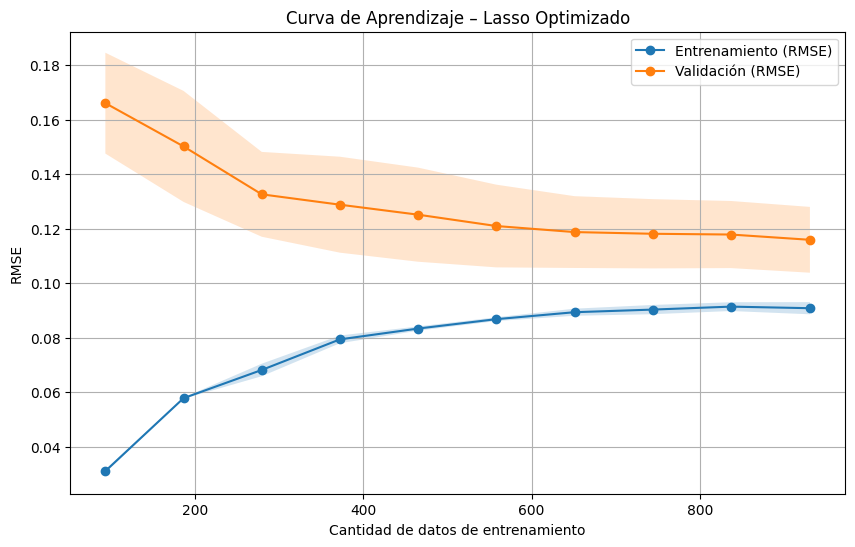

In [61]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np

# Usar tu modelo final (best_model)
model = best_model

train_sizes, train_scores, test_scores = learning_curve(
    model,
    X_train,
    y_train,
    cv=5,
    scoring='neg_mean_squared_error',
    train_sizes=np.linspace(0.1, 1.0, 10),
    n_jobs=-1
)

# Convertir errores negativos a RMSE
train_rmse = np.sqrt(-train_scores)
test_rmse = np.sqrt(-test_scores)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_rmse.mean(axis=1), 'o-', label="Entrenamiento (RMSE)")
plt.plot(train_sizes, test_rmse.mean(axis=1), 'o-', label="Validación (RMSE)")

# Rango de variación (sombras)
plt.fill_between(train_sizes,
                 train_rmse.mean(axis=1) - train_rmse.std(axis=1),
                 train_rmse.mean(axis=1) + train_rmse.std(axis=1),
                 alpha=0.2)

plt.fill_between(train_sizes,
                 test_rmse.mean(axis=1) - test_rmse.std(axis=1),
                 test_rmse.mean(axis=1) + test_rmse.std(axis=1),
                 alpha=0.2)

plt.title("Curva de Aprendizaje – Lasso Optimizado")
plt.xlabel("Cantidad de datos de entrenamiento")
plt.ylabel("RMSE")
plt.legend()
plt.grid(True)
plt.show()
